# Libraries

In [1]:
import psutil
psutil.virtual_memory() 

svmem(total=540408942592, available=521995378688, percent=3.4, used=15024463872, free=523341828096, active=818020352, inactive=6725337088, buffers=4354048, cached=2038296576, shared=236580864, slab=1622945792)

In [2]:
from datetime import datetime

import numpy as np
import pandas as pd
from numpy import array

from os import listdir
from os.path import isfile, join
import glob

import pickle

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
#import cmocean
##from mpl_toolkits.basemap import Basemap

from matplotlib import ticker
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as colors
import matplotlib.pyplot as plt

from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from cartopy.mpl.ticker import LongitudeFormatter


import metpy.calc as mpcalc
from metpy.units import units
import numpy as np
from scipy.ndimage import gaussian_filter
import xarray as xr
import scipy as _sp

import scipy.linalg as sc
import numpy.linalg as lin

import pickle

In [3]:
from scipy.spatial import distance

from scipy.signal import argrelextrema
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KernelDensity

#%pdb
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
import klus.algorithms as al
import klus.kernels as kernels
# import d3s.tools as tools
# import d3s.domain as domain

In [5]:
import zapata.computation as zcom
import zapata.data as zdat
import zapata.lib as zlib
import zapata.mapping as zmap
import zapata.koopman as zkop

import cftime

# Definition of functions

## Definition order_w

In [6]:
def order_w(w,option='magnitude',direction='up'):
    '''
    Order Eigenvalues according to 
    option
    'magnitude'         abs(w)
    'frequency'         w.imag
    'growth'            w.real
    'ones'              abs(w) closest to 1.0
    
    direction
    'up'               descending
    'down'             ascending
    
    '''
    print(' Ordering Eigenvalues as ', option, ' with direction ',direction)
    w_cont = np.log(w)
    if option == 'magnitude':
        ind=abs(w).argsort()
    elif option == 'frequency':
        ind=abs(w_cont.imag).argsort()
    elif option == 'growth':
        ind=np.abs(w_cont.real - 0.0).argsort()
    elif option == 'one':
        ind=np.abs(np.abs(w) - 1.0).argsort()
    else:
        print(' Error in oder_w', option, direction)
# Choose direction
    if direction == 'up':
        indu=ind[::-1]
    else:
        indu=ind

    w0=w[indu]
    w1=w_cont[indu]
    return w0,w1,indu


## Definition function evolve and verify

In [7]:
def evolve(tim_level,tstep,init_date):
    #tim_level=[0,1,2,3,4,5,6]
    #cases =  216,228,240, 36,48,60,  360,372,384
    #tstep=3
    #nstart=360
    x0=PsiX[:,init_date]
    ht=np.zeros([x0.shape[0],len(tim_level)],dtype='complex')
    for j in tim_level:
        D = np.diag(vw_s[:nmode]**(j*tstep))                  # w --> vw_s
        ht[:,j]=alpha@D@vcut.T@Gxx[init_date,:] 
    return ht

#verify to EOF expansion  (spatial correlation)
def verify(tim_level,tstep,init_date,PCs,ht,verbose=False):
    sstcor=np.zeros([len(tim_level)])
    sstlab=np.zeros([len(tim_level)],dtype='int')
    for neig in range(len(tim_level)):
        kaz1=ht[:,neig].real 
        kaz2=PCs[:,int(init_date+neig*tstep)]
        ytmp = np.expand_dims(udat_tot[:,0:nEOF_SST]@kaz1, axis=1)
        ztmp = np.expand_dims(udat_tot[:,0:nEOF_SST]@kaz2, axis=1)
        #ICcase=lib.year2date(years,nstart)
        #ICdat=lib.year2date(years,tstep*neig+nstart)
        #label1 = ' at {}, IC at {}'.format(ICdat,ICcase)
        val=np.corrcoef(ytmp[:,0],ztmp[:,0])[0,1]
        if verbose : print(' Correlation at {}    {}'.format(label1,val))
        sstcor[neig]=val
        sstlab[neig]=int(tstep*neig+init_date)
    return sstcor,sstlab


#verify to total data
def verify_tot(tim_level,tstep,init_date,X,ht,verbose=False):
    sstcor=np.zeros([len(tim_level)])
    sstlab=np.zeros([len(tim_level)],dtype='int')
    for neig in range(len(tim_level)):
        kaz1=ht[:,neig].real 
        ytmp = np.expand_dims(udat_tot[:,0:nEOF_SST]@kaz1, axis=1)
        ztmp = X.A.data[:, int(init_date+neig*tstep)]
        #ICcase=lib.year2date(years,nstart)
        #ICdat=lib.year2date(years,tstep*neig+nstart)
        #label1 = ' at {}, IC at {}'.format(ICdat,ICcase)
        val=np.corrcoef(ytmp[:,0],ztmp)[0,1]
        if verbose : print(' Correlation at {}    {}'.format(label1,val))
        sstcor[neig]=val
        sstlab[neig]=int(tstep*neig+init_date)
    return sstcor,sstlab

## Definition dates2years

In [8]:
def date2year(years,init_year,date):
    """Transform index date ['Jan' '1989' ] in index i.
    
    Years are from np.arange(1960,2020, 1/12)
    """
    mon=['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
    y=float(date[4:8])
    m=mon.index(str(date[0:3]))
    index = (y-init_year)*12 + m
    return int(index)

In [9]:
def year2date(years,i):
    """ Transform index i in string date yy/mm.
    
    Rounding requires the small shift
    Years are obtained from np.arange(1920,2018, 1/12)
    """
    mon=['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
    y=str(int(years[i]+0.001))
    m=np.mod(int(round((years[i]-int(years[i]))*12)),12)
    date = mon[m] + ' ' + y
    return date

## Definition eigenvalues on points

In [10]:
def eigenfunction_value(cc, KK_tot, x, mode ):
    '''
    Compute eigenfunction value at point x

    Parameters
    ----------
    x: Point at which eigenfunction is computed
    mode: Mode number

    Returns
    -------
    eigenfunction value
    '''
    k = KK_tot.ker
    f = 0
    for i in range(KK_tot.ntime):
        f +=  cc[i,mode]*k(x, KK_tot.PsiX[:, i])       #somma per tutti i tempo: componente del modo (colonna) per kernel(initial condition x, fila PsiX)
    return f

In [11]:
def eigenfunction_value_opt(cc, KK_tot, x, mode):
    '''
    Compute eigenfunction value at point x

    Parameters
    ----------
    x: Point at which eigenfunction is computed
    mode: Mode number

    Returns
    -------
    eigenfunction value
    '''
    k = KK_tot.ker
    ntime = KK_tot.ntime
    PsiX = KK_tot.PsiX
    mode_cc = cc[:, mode]  # Extract the mode component once

    # Precompute k(x, PsiX) to avoid redundant calculations
    k_values = np.array([k(x, PsiX[:, i]) for i in range(ntime)])

    f = np.dot(mode_cc, k_values)  # Use NumPy dot product for summation
    return f

## Definition sigma cost function

In [12]:
from scipy.optimize import minimize_scalar

In [13]:
def cost(x):
    ss = str(x)
    KK_tot.fit(bandwidth=ss)
    KMM = sc.pinv(KK_tot.vv)@(KK_tot.PsiX.T)
    return sum(lin.norm(KK_tot.vv@KMM-KK_tot.PsiX.T, axis=0))

# Load and regrid data

In [6]:
#CMIP Jakob
ds_tos = xr.open_dataarray("CESM_data/regridded_tos.nc")
ds_ssh = xr.open_dataarray("CESM_data/regridded_ssh.nc")

In [7]:
ds_tos

<xarray.DataArray (time: 24000, lat: 180, lon: 360)>
[1555200000 values with dtype=float32]
Coordinates:
  * time     (time) object 0001-02-01 00:00:00 ... 2001-01-01 00:00:00
    z_t      float32 ...
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * lat      (lat) float64 -90.0 -89.0 -88.0 -87.0 -86.0 ... 86.0 87.0 88.0 89.0
Attributes:
    regrid_method:  bilinear

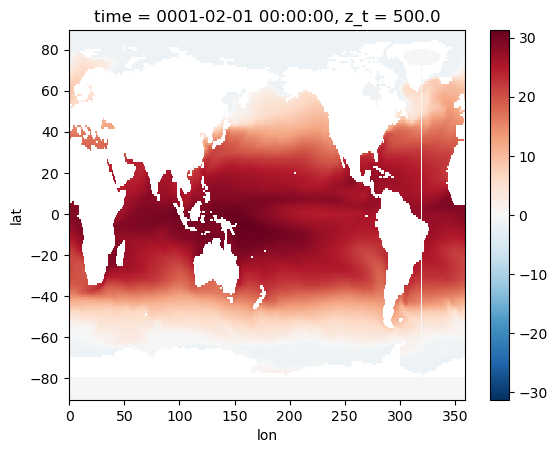

In [8]:
ds_tos.isel(time=0).plot()

## Subset data

In [9]:
#  Read Variable
area='Jakob'
if area == 'TROPIC':
    # central pacific coordinates
    arealat=(35,-35)
    arealon=[-180, 180.]
elif area == 'GLOBAL':
    arealat=(60,-60)
    arealon=[-160,110.]
elif area == 'WORLD':
    arealat=(60,-60)
    arealon=[-180,180.]
elif area == 'NAVARRA_2021':
    arealat=(-15,15)
    arealon=[140,290.]
elif area == 'Jakob':
    arealat=(-31,32)
    arealon=[130,290.]
else:
    Print(f'No area ')
    
case = 'UNIT'    
data_name= 'CESM'
variable='SST'
lev = 'SURF'
shift = 'ERA5'
period = 'ANN'
normalization = 'anom'

# Use SVD encoding
encode_svd = True
#Choose number of SVD to ratain
var_retained = None #None# Variance retained or None for full rank
#Option to write files
write_files = False

In [10]:
S_tos = ds_tos.sel(lat=slice(arealat[0],arealat[1]),lon=slice(arealon[0],arealon[1]))
S_ssh = ds_ssh.sel(lat=slice(arealat[0],arealat[1]),lon=slice(arealon[0],arealon[1]))

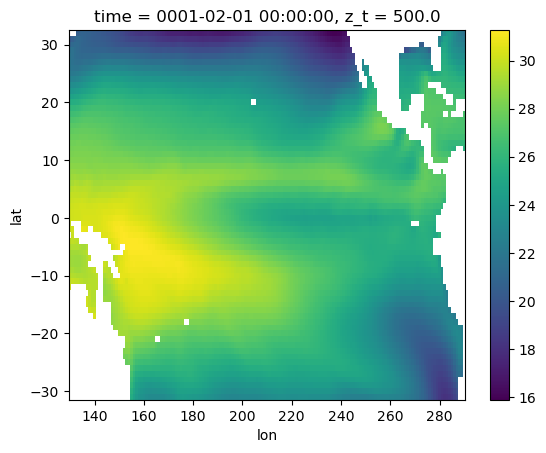

In [11]:
S_tos.isel(time=0).plot()

In [12]:
del(ds_tos, ds_ssh)

In [13]:
import psutil
psutil.virtual_memory() 

svmem(total=540408942592, available=521775505408, percent=3.4, used=15244279808, free=523121901568, active=818012160, inactive=6943223808, buffers=4354048, cached=2038407168, shared=236584960, slab=1624072192)

## Create matrices, de-trending data and anomalies

In [14]:
#Create Xmats
X_tos=zcom.Xmat(S_tos,dims=('lat','lon'))
X_tos.A = X_tos.A.dropna(dim='z')

 Created mathematical matrix A, 
                 stacked along dimensions ('lat', 'lon') 


In [15]:
X_ssh=zcom.Xmat(S_ssh,dims=('lat','lon'))
X_ssh.A = X_ssh.A.dropna(dim='z')

 Created mathematical matrix A, 
                 stacked along dimensions ('lat', 'lon') 


In [16]:
del(S_tos,S_ssh)

In [17]:
#Detrending
X_tos.detrend(axis=1)
X_ssh.detrend(axis=1)

Detrending data with options -->  {'axis': 1}
Detrending data with options -->  {'axis': 1}


In [18]:
#Anomalies
X_tos.anom(option='anomstd',freq='month')
X_ssh.anom(option='anomstd',freq='month')

In [19]:
X_tos

 
 Math Data Matrix 
 <xarray.DataArray (z: 9121, time: 24000)>
array([[ 0.39702561, -0.6189601 , -0.85483384, ...,  0.01755011,
         0.44849578,  0.4526632 ],
       [ 0.16964272, -0.86700904, -0.8274779 , ..., -0.18566246,
         0.3066347 ,  0.07497334],
       [ 0.04912709, -0.89396954, -0.65545326, ..., -0.32773435,
         0.22504175, -0.14663897],
       ...,
       [ 0.3943229 ,  0.8016616 ,  0.883215  , ..., -0.28593993,
        -0.38302985, -0.24683295],
       [ 0.26451665,  0.65635806,  0.8421261 , ..., -0.36678204,
        -0.34379792, -0.21504782],
       [ 0.13002267,  0.5547349 ,  0.7721556 , ..., -0.3915165 ,
        -0.3230492 , -0.17562729]], dtype=float32)
Coordinates:
  * time     (time) object 0001-02-01 00:00:00 ... 2001-01-01 00:00:00
    z_t      float32 500.0
  * z        (z) object MultiIndex
  * lat      (z) float64 -31.0 -31.0 -31.0 -31.0 -31.0 ... 32.0 32.0 32.0 32.0
  * lon      (z) int64 155 156 157 158 159 160 161 ... 285 286 287 288 289 290
    

# Functions and parameters

In [20]:
encode_svd=True

In [21]:
from sklearn.neighbors import KernelDensity
from matplotlib.ticker import FormatStrFormatter

In [22]:
flabel = {'fontsize':10,'fontweight':'bold'}
ftitle = {'fontsize':12,'fontweight':'bold'}

In [23]:
def compute_density(ax,vw_o,bandw, over=0.02):
    vmode=np.zeros([len(vw_o),1])
    #vmode[:,0]=np.abs(np.angle(wo,deg=True))
    vmode[:,0] = np.log(vw_o).imag
    X_plot = np.linspace(0, 2, 4000)[:, np.newaxis]
    kde = KernelDensity(kernel='gaussian', bandwidth=bandw).fit(vmode)
    log_dens = kde.score_samples(X_plot)
    points= np.exp(log_dens)
    locmax = argrelextrema(points, np.greater)
    base = np.mean(points) 
    ax.plot(X_plot[:, 0], points)
    ax.axhline(base,linewidth=0.6)
    for i in  range(len(locmax[0])):
        if(abs(X_plot[locmax[0][i],0].squeeze()) < plim) and (X_plot[locmax[0][i],0].squeeze() > 0) and (points[locmax[0][i]] > base  + over):
            #ax.text(X_plot[locmax[0][i],0].squeeze(),points[locmax[0][i]]+0.01,f'{zkop.one_over_years(abs(X_plot[locmax[0],0][i])):0.2f}')
            ax.text(X_plot[locmax[0][i],0].squeeze(),points[locmax[0][i]]+0.004,f'{zkop.one_over_years(abs(X_plot[locmax[0],0][i])):0.2f}')
            ax.plot(X_plot[locmax[0][i],0].squeeze(),points[locmax[0][i]],'o',color='blue')
            #ax.text(X_plot[locmax[0][i],0].squeeze(),points[locmax[0][i]]+0.01,f'{zkop.one_over_years(abs(X_plot[locmax[0],0][i])):0.2f}')
        
    return points


# Compute Koopman operators 100 (20)

In [6]:
chunks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]
chunks

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

### ALL EOFs GAUSS

In [7]:
encode_svd=True

In [8]:
PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_100_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[ 95.37587993,  92.37228799,  97.96581586,  87.0778909 ,
         90.02688981, 102.68022395,  92.47693163,  83.48891223,
         95.0778926 ,  89.92775259,  93.98951319,  94.32731796,
         87.59286044,  89.45015692,  93.25496797, 104.27890556,
         89.19941424,  91.48527074,  87.20525055,  95.85125936],
       [ 94.61070584,  91.57458601,  94.32333982,  90.25183818,
         91.77863432,  94.97621535,  91.9557351 ,  90.18066087,
         91.43423588,  91.54861854,  93.22304408,  93.74777324,
         91.11745918,  91.44840824,  93.20292482,  98.65408093,
         91.12845447,  92.74033128,  90.28748799,  94.80031995]])

0
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 94.6107058386552 for a  17902.371318577094 and sigma 94.6107058386552

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



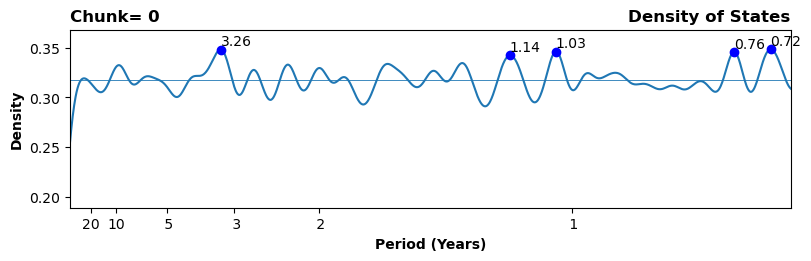

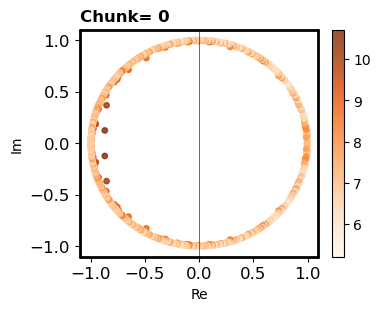

1
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.57458601033339 for a  16771.809605927898 and sigma 91.57458601033339

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



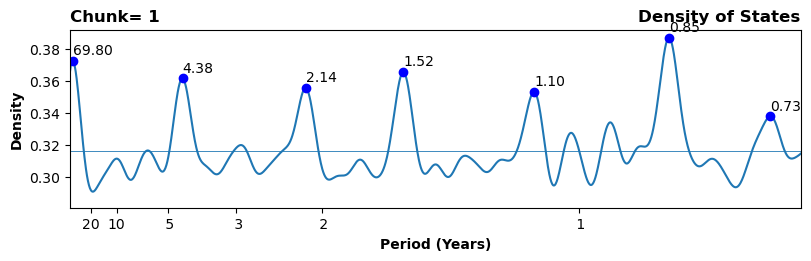

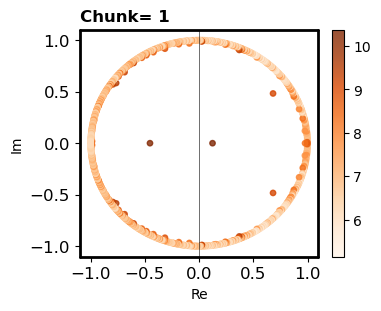

2
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 94.32333982260565 for a  17793.784870581487 and sigma 94.32333982260565

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



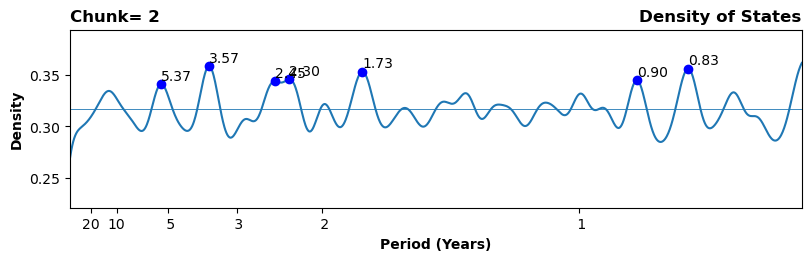

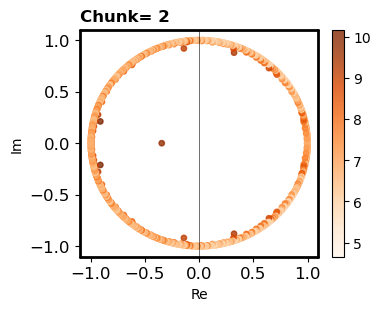

3
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 90.25183817933636 for a  16290.788589498232 and sigma 90.25183817933636

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



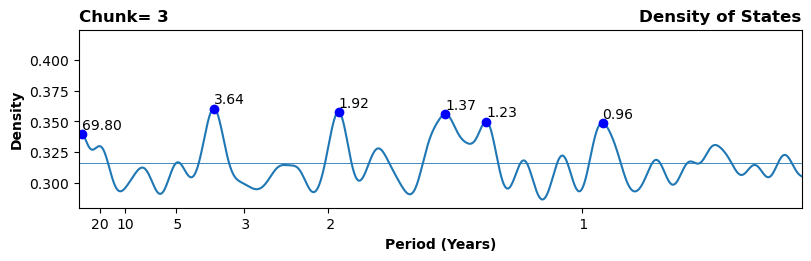

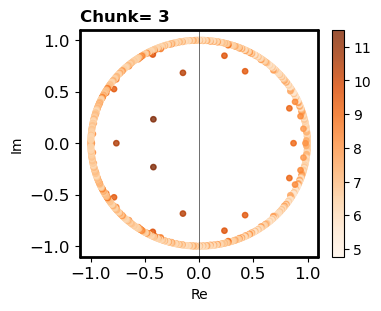

4
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.77863431634044 for a  16846.635433945088 and sigma 91.77863431634044

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



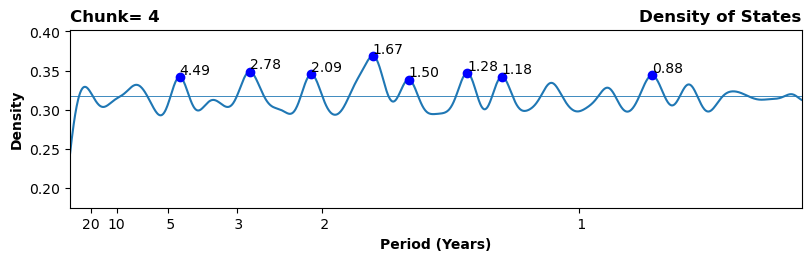

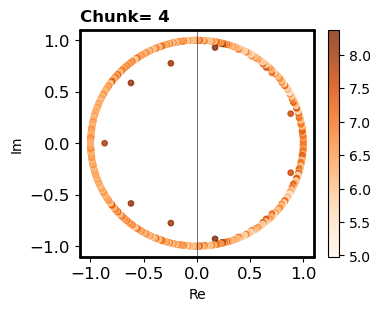

5
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 94.97621535231448 for a  18040.962965298433 and sigma 94.97621535231448

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



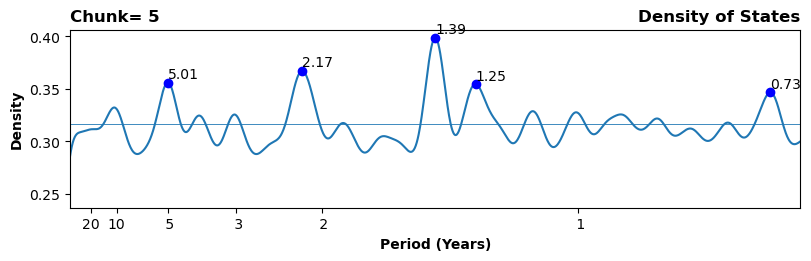

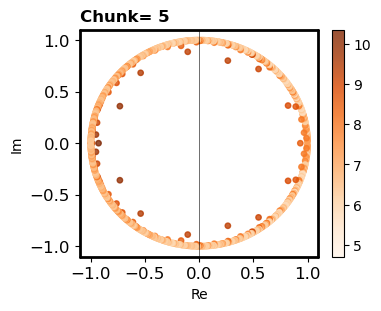

6
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.95573509857365 for a  16911.714435038102 and sigma 91.95573509857365



KeyboardInterrupt: 

In [15]:
inverse = zkop.one_over_years
bandw =  0.01
encode_svd=True
tot_points=np.zeros((4000,20))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*1200:1200+nchunk*1200]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
        ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='right',**ftitle)
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)
    
    
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    #labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(3.7,3),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=15
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.4)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 10)
    ax.set_ylabel('Im',fontsize = 10)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)  
    plt.show()


### 30 EOFs GAUSS

In [29]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_100_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[ 93.92169863,  90.74941267,  95.57085161,  85.89155872,
         88.44491823, 100.39123986,  90.56996597,  81.83153122,
         92.98262197,  88.70057989,  92.39564315,  92.57396192,
         86.37603794,  87.70898446,  91.56364195, 102.0955315 ,
         87.44955303,  90.07982196,  85.78521033,  94.34046872],
       [ 80.61909321,  77.28596733,  80.48925158,  75.91177601,
         77.39431409,  80.60780582,  77.34711231,  75.59949428,
         76.902306  ,  77.13250827,  79.20128704,  79.41600965,
         76.53976329,  76.96282605,  79.3040024 ,  84.88129084,
         76.70405456,  78.41371873,  76.24614376,  80.79316491]])

0
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.61909321416101 for a  12998.876381347165 and sigma 80.61909321416101

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



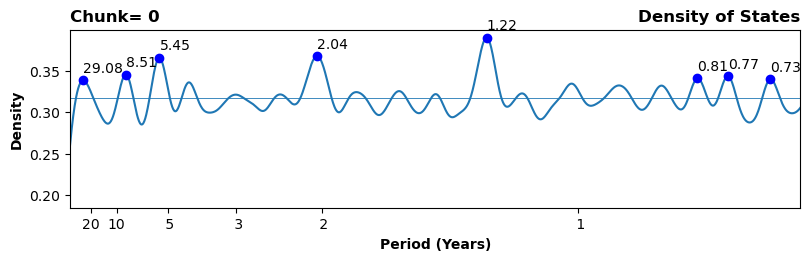

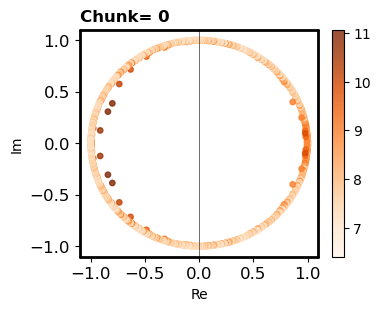

1
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.28596733235378 for a  11946.24149299531 and sigma 77.28596733235378

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



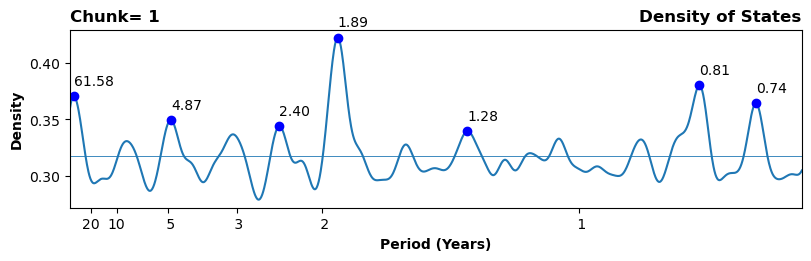

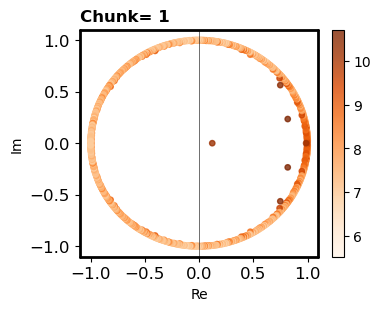

2
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.48925158349809 for a  12957.039240943299 and sigma 80.48925158349809

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



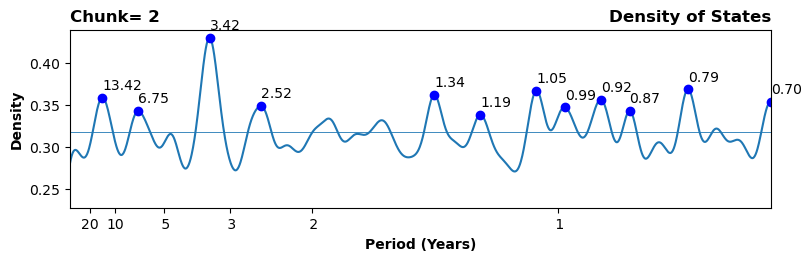

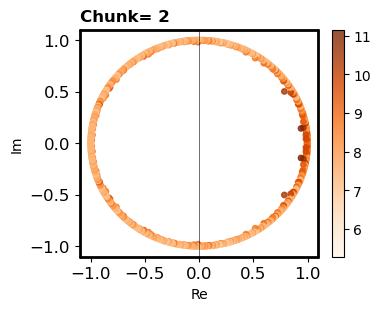

3
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.9117760103274 for a  11525.195474084238 and sigma 75.9117760103274

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



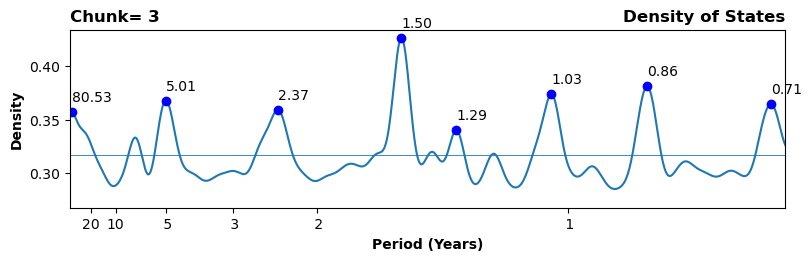

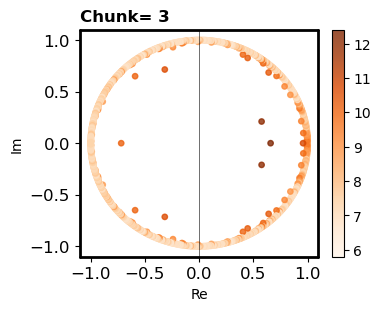

4
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.39431408990386 for a  11979.759706893381 and sigma 77.39431408990386

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



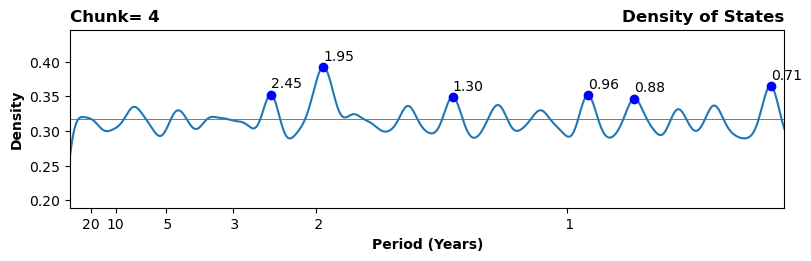

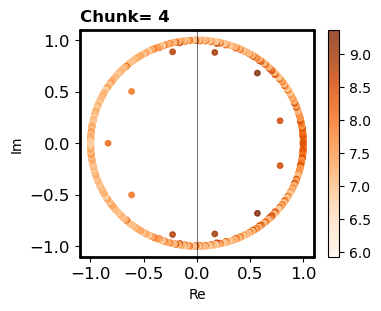

5
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.6078058245774 for a  12995.236719705548 and sigma 80.6078058245774

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



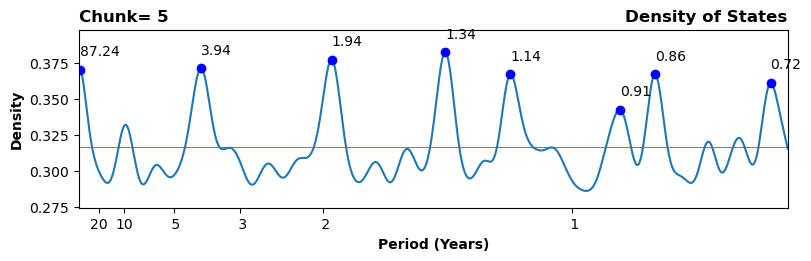

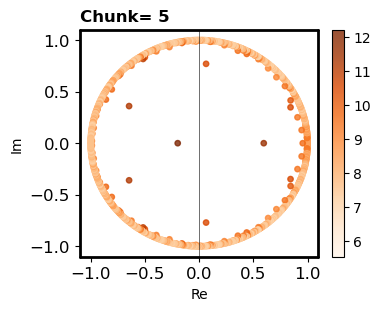

6
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.34711230917821 for a  11965.151565137256 and sigma 77.34711230917821

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



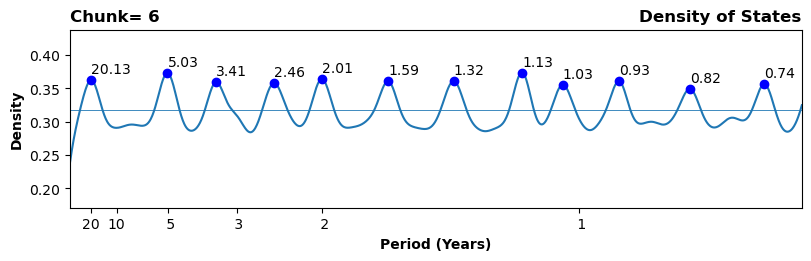

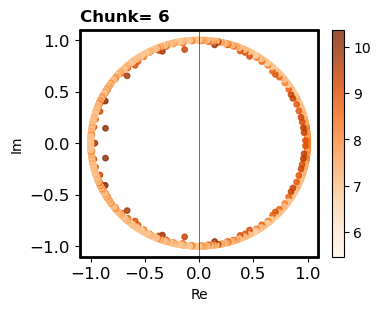

7
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.59949427828465 for a  11430.567070264788 and sigma 75.59949427828465

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



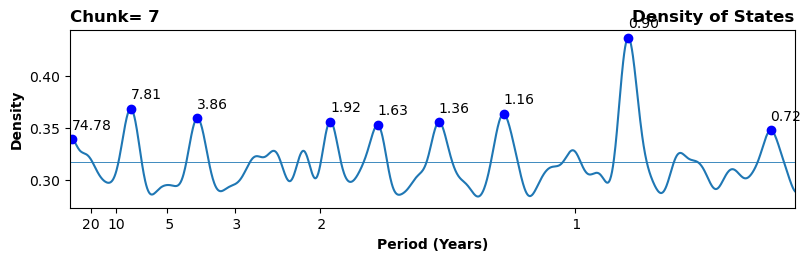

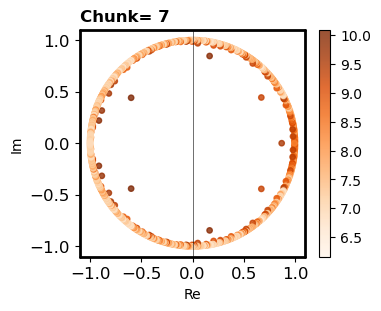

8
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.90230599685924 for a  11827.929335269146 and sigma 76.90230599685924

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



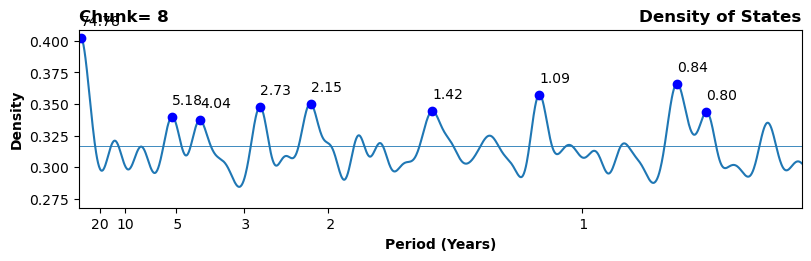

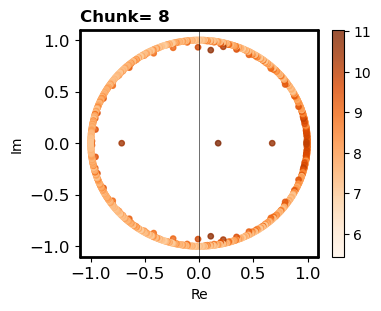

9
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.13250827468535 for a  11898.847665488807 and sigma 77.13250827468535

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



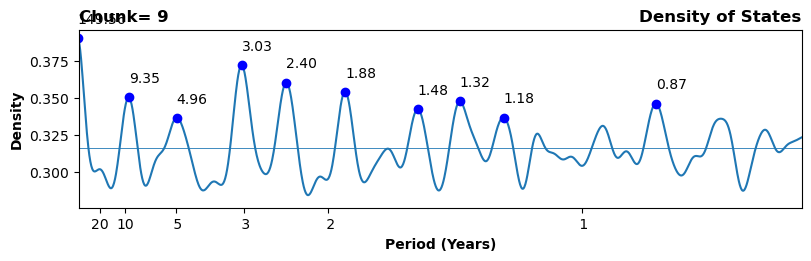

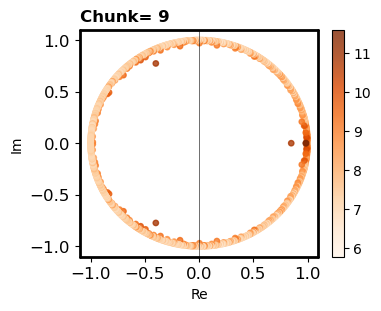

10
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.2012870411596 for a  12545.687737952312 and sigma 79.2012870411596

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



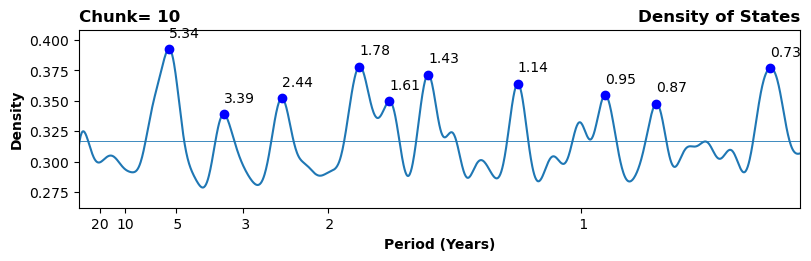

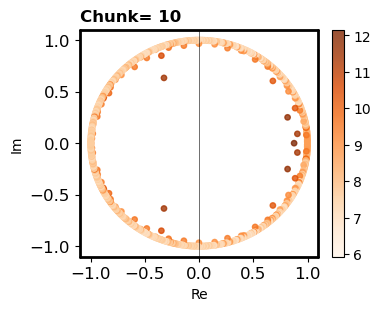

11
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.41600964735899 for a  12613.805176618833 and sigma 79.41600964735899

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



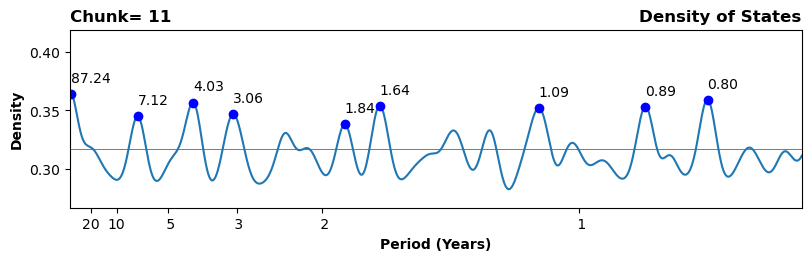

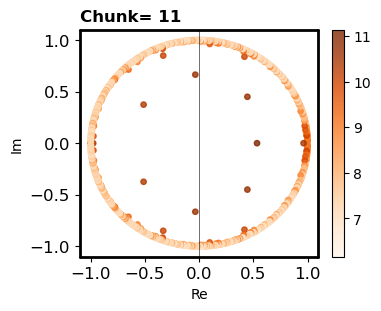

12
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.5397632862058 for a  11716.670727816834 and sigma 76.5397632862058

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



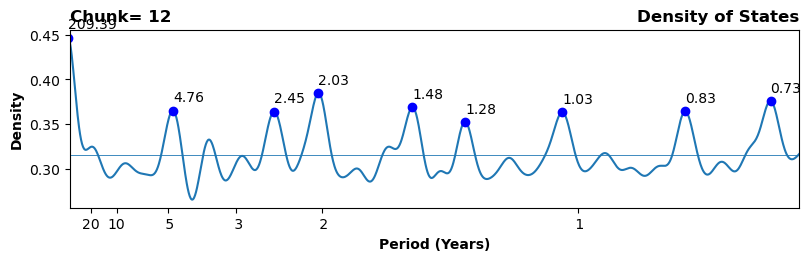

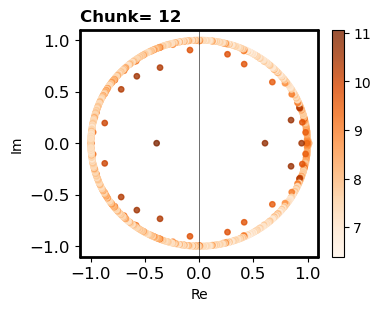

13
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.96282605343755 for a  11846.553188263373 and sigma 76.96282605343755

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



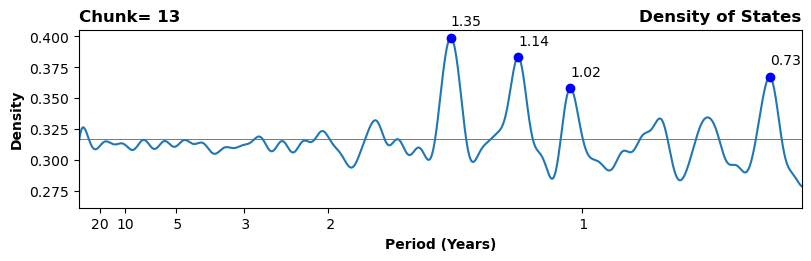

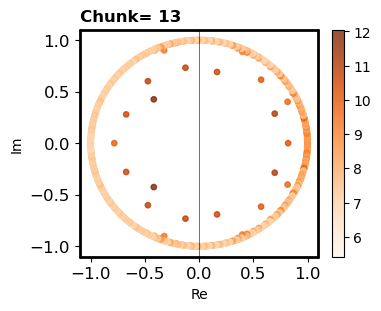

14
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.3040024041893 for a  12578.249594647326 and sigma 79.3040024041893

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



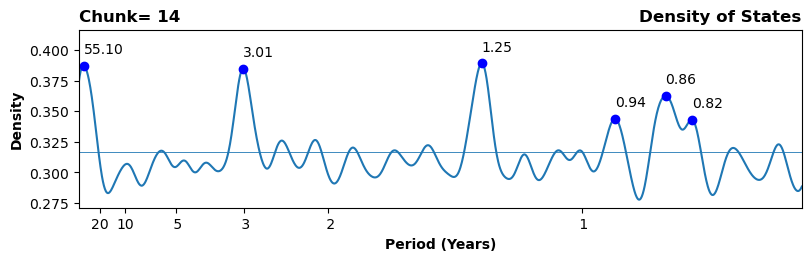

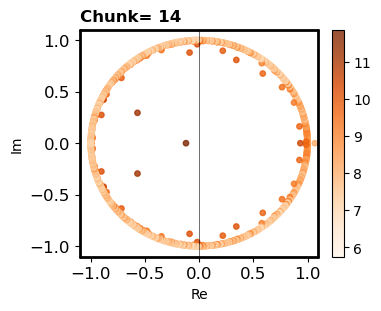

15
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 84.88129083948618 for a  14409.667069154882 and sigma 84.88129083948618

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



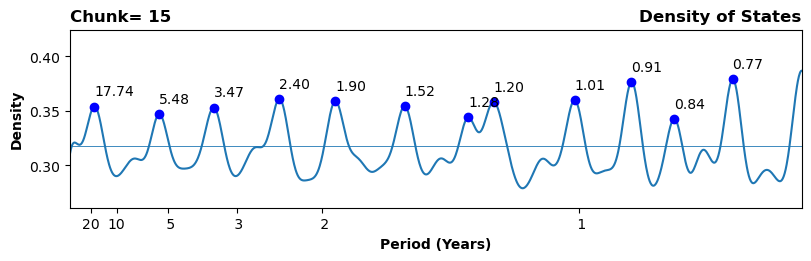

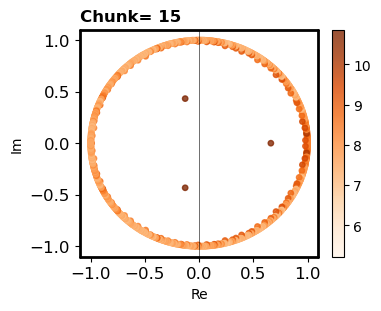

16
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.70405455998205 for a  11767.023971881408 and sigma 76.70405455998205

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



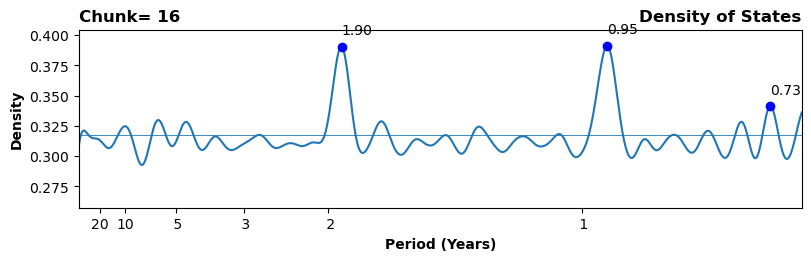

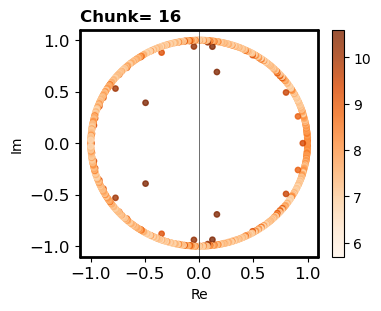

17
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.41371872798643 for a  12297.422569503542 and sigma 78.41371872798643

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



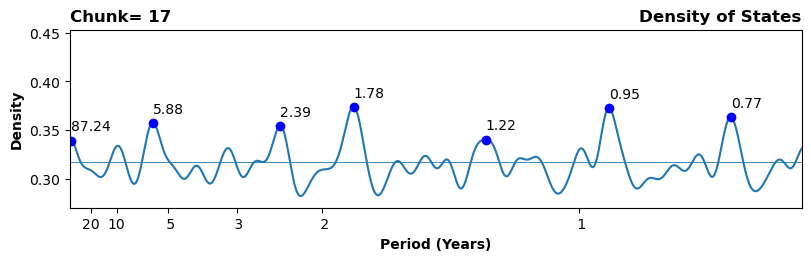

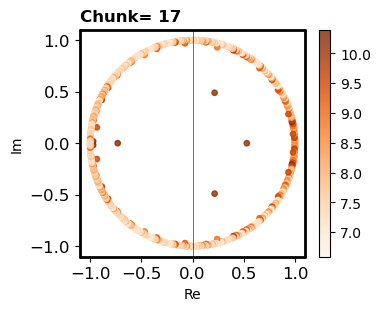

18
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.24614376116199 for a  11626.948876895562 and sigma 76.24614376116199

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



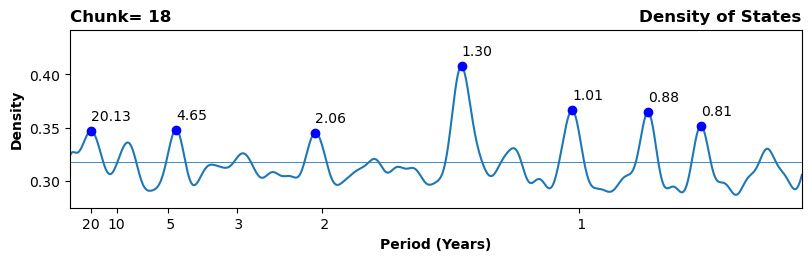

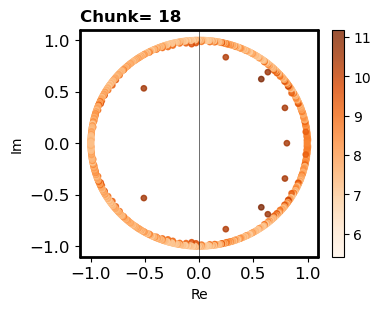

19
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.79316490817105 for a  13055.070991757844 and sigma 80.79316490817105

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



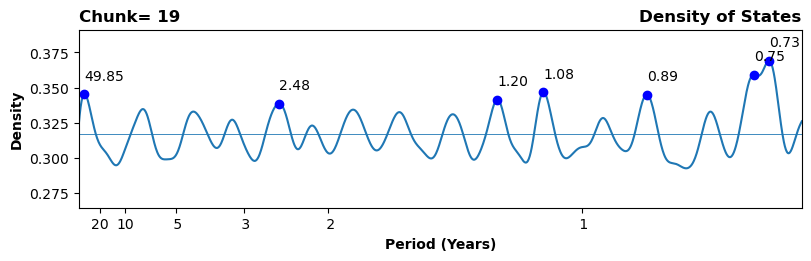

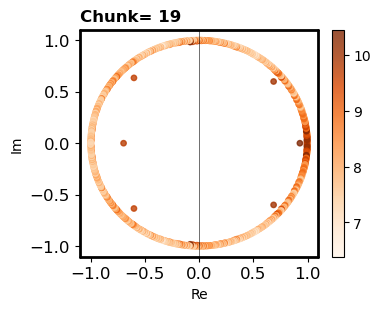

In [30]:
inverse = zkop.one_over_years
bandw =  0.009
encode_svd=True
tot_points=np.zeros((4000,20))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*1200:1200+nchunk*1200]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='right',**ftitle)
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)
    
    
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(3.7,3),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=15
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.4)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 10)
    ax.set_ylabel('Im',fontsize = 10)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)  
    plt.show()


### Poly

In [31]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_100_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[ 93.92169863,  90.74941267,  95.57085161,  85.89155872,
         88.44491823, 100.39123986,  90.56996597,  81.83153122,
         92.98262197,  88.70057989,  92.39564315,  92.57396192,
         86.37603794,  87.70898446,  91.56364195, 102.0955315 ,
         87.44955303,  90.07982196,  85.78521033,  94.34046872],
       [ 80.61909321,  77.28596733,  80.48925158,  75.91177601,
         77.39431409,  80.60780582,  77.34711231,  75.59949428,
         76.902306  ,  77.13250827,  79.20128704,  79.41600965,
         76.53976329,  76.96282605,  79.3040024 ,  84.88129084,
         76.70405456,  78.41371873,  76.24614376,  80.79316491]])

0
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.61909321416101 for a  12998.876381347165 and sigma 80.61909321416101

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



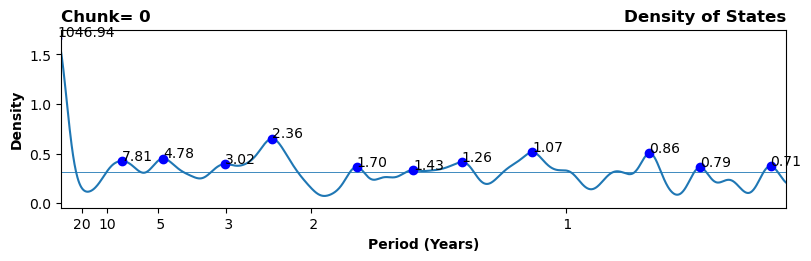

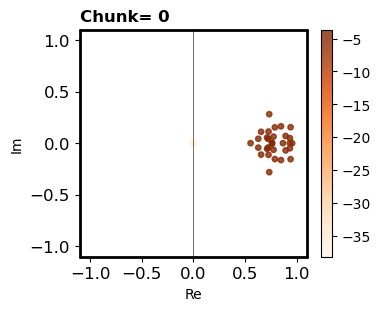

1
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.28596733235378 for a  11946.24149299531 and sigma 77.28596733235378

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



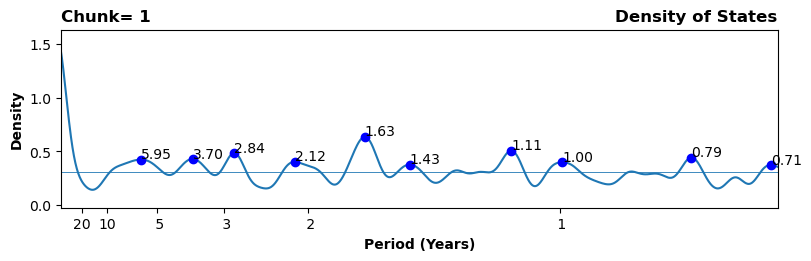

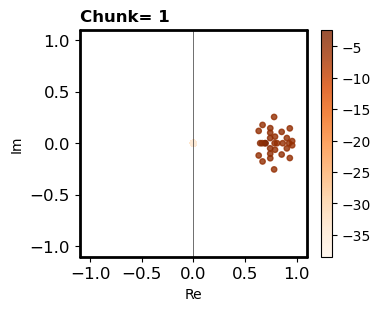

2
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.48925158349809 for a  12957.039240943299 and sigma 80.48925158349809

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



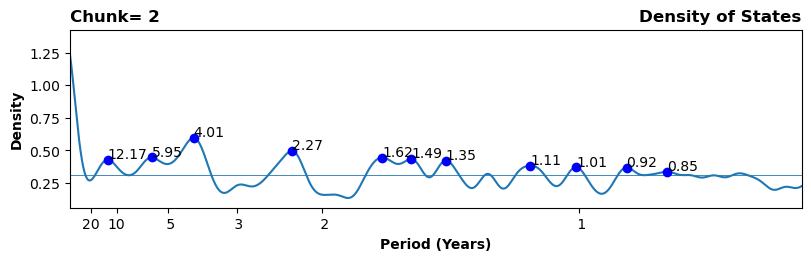

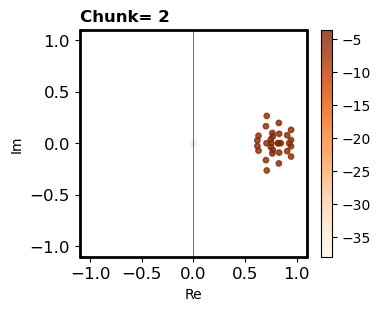

3
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.9117760103274 for a  11525.195474084238 and sigma 75.9117760103274

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



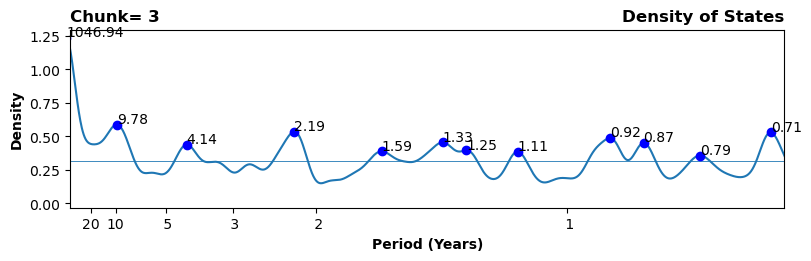

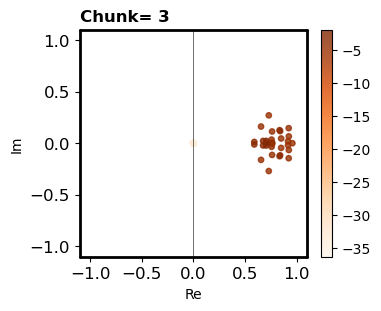

4
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.39431408990386 for a  11979.759706893381 and sigma 77.39431408990386

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



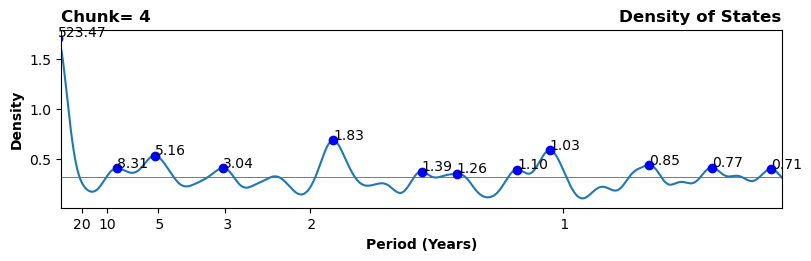

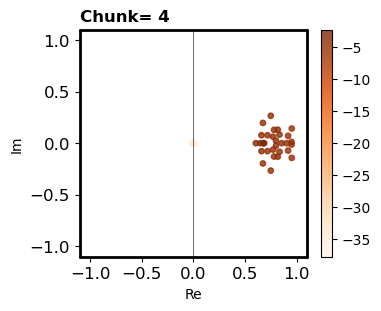

5
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.6078058245774 for a  12995.236719705548 and sigma 80.6078058245774

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



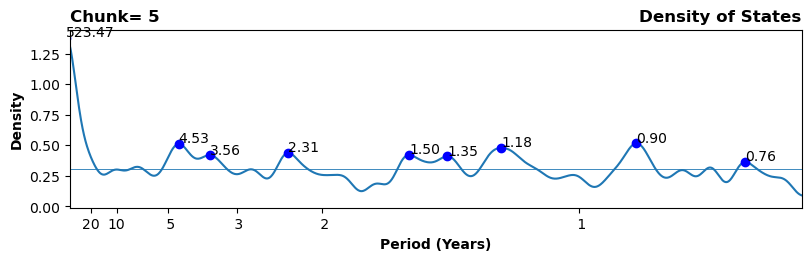

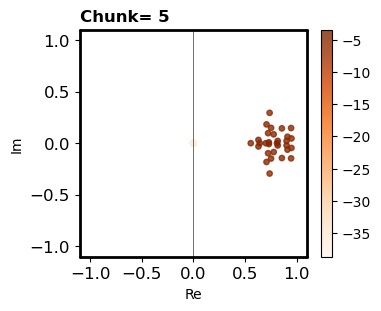

6
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.34711230917821 for a  11965.151565137256 and sigma 77.34711230917821

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



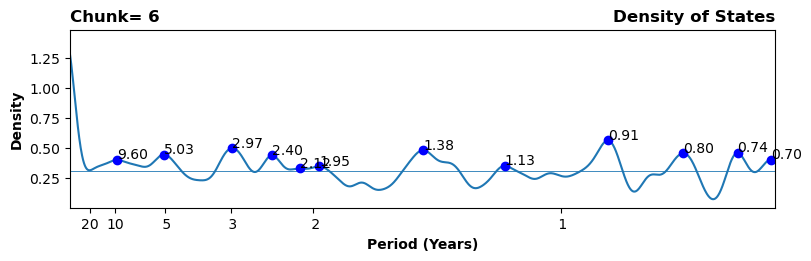

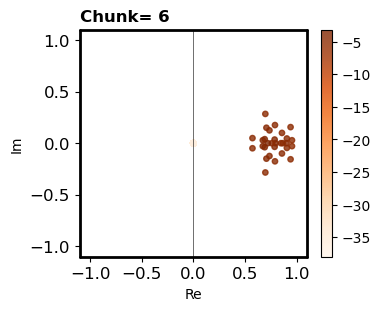

7
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.59949427828465 for a  11430.567070264788 and sigma 75.59949427828465

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



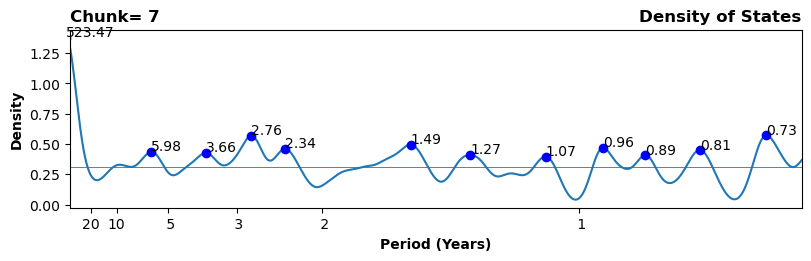

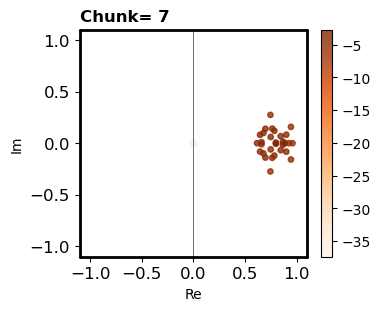

8
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.90230599685924 for a  11827.929335269146 and sigma 76.90230599685924

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



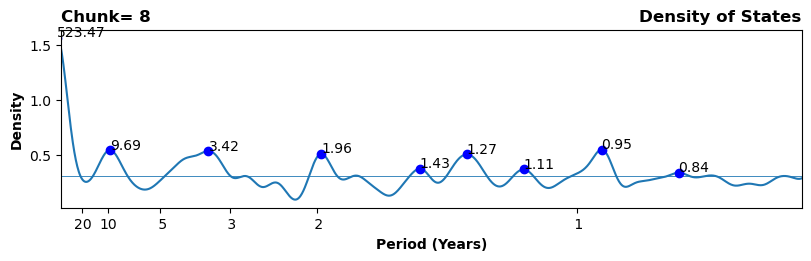

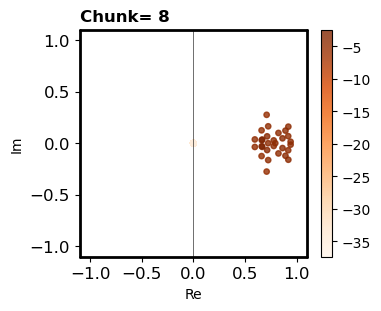

9
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.13250827468535 for a  11898.847665488807 and sigma 77.13250827468535

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



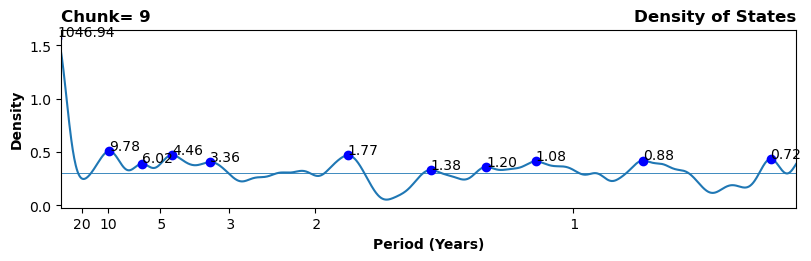

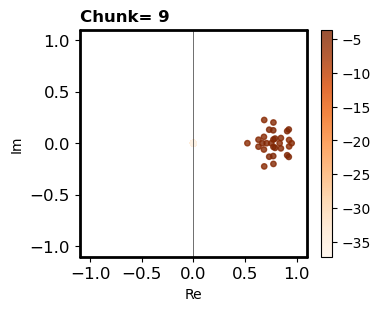

10
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.2012870411596 for a  12545.687737952312 and sigma 79.2012870411596

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



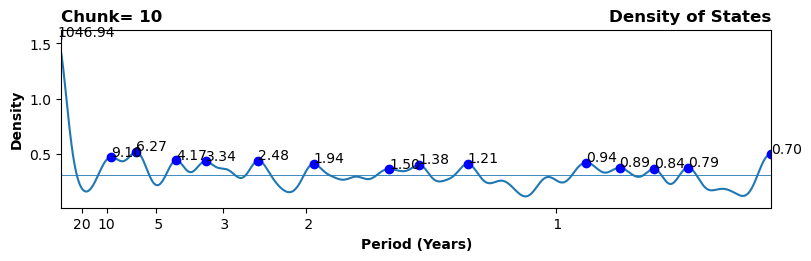

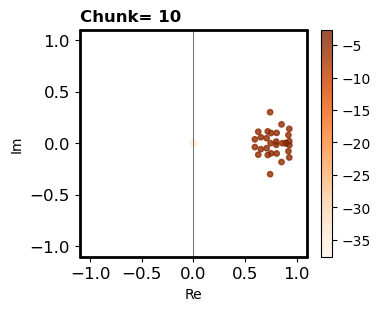

11
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.41600964735899 for a  12613.805176618833 and sigma 79.41600964735899

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



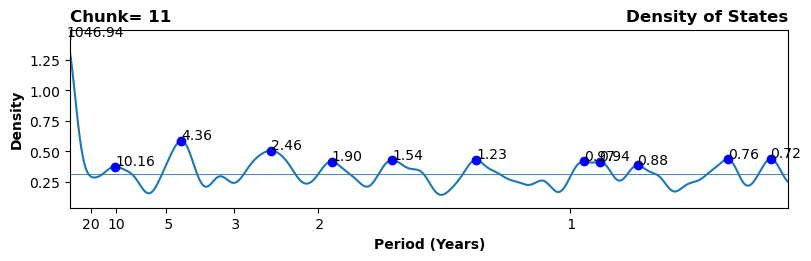

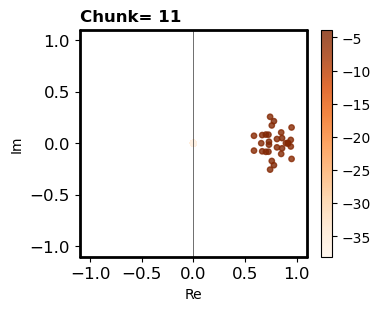

12
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.5397632862058 for a  11716.670727816834 and sigma 76.5397632862058

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



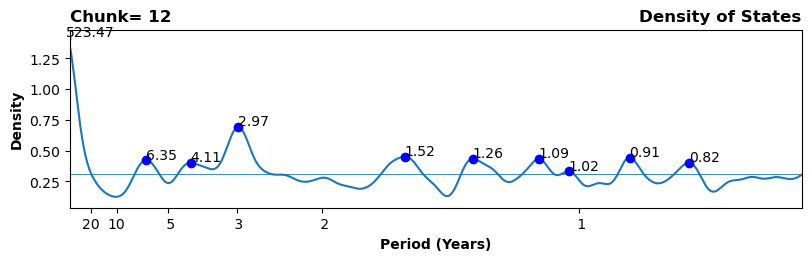

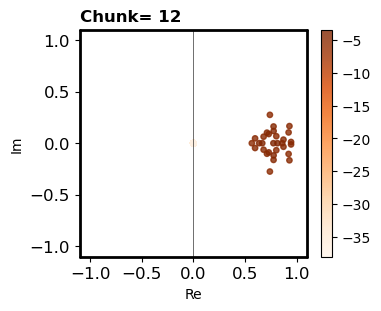

13
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.96282605343755 for a  11846.553188263373 and sigma 76.96282605343755

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



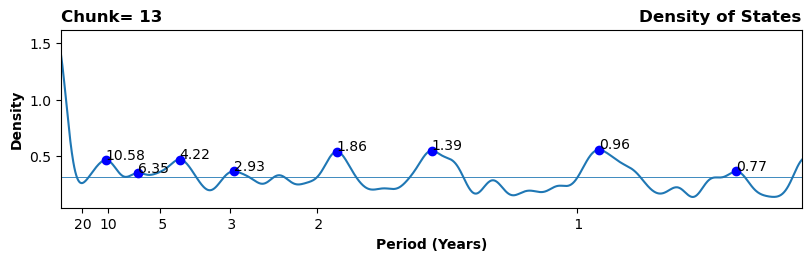

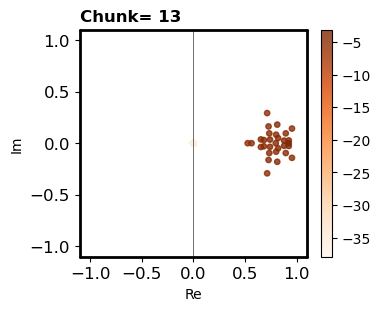

14
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.3040024041893 for a  12578.249594647326 and sigma 79.3040024041893

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



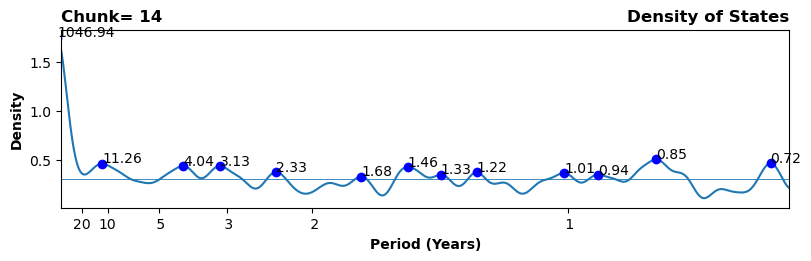

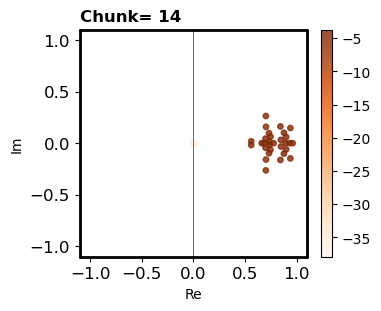

15
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 84.88129083948618 for a  14409.667069154882 and sigma 84.88129083948618

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



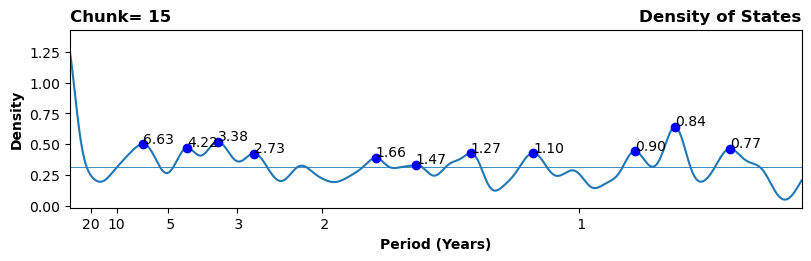

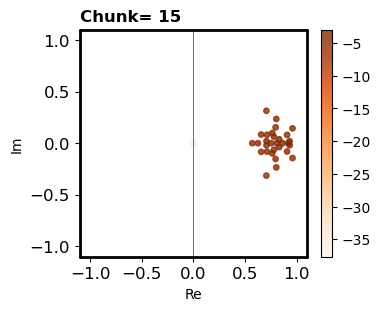

16
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.70405455998205 for a  11767.023971881408 and sigma 76.70405455998205

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



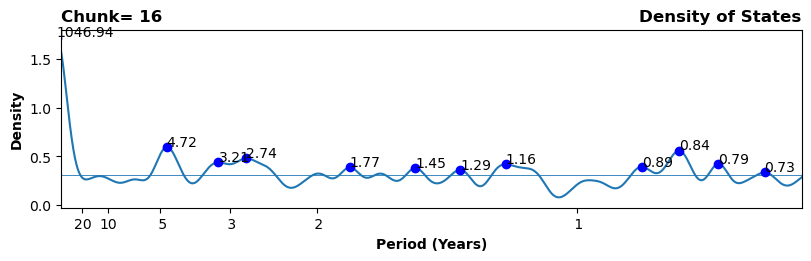

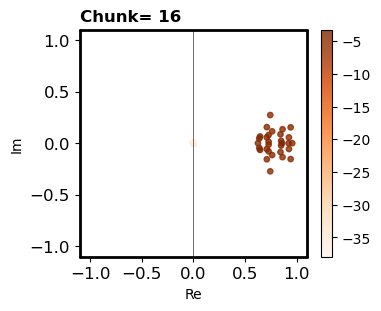

17
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.41371872798643 for a  12297.422569503542 and sigma 78.41371872798643

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



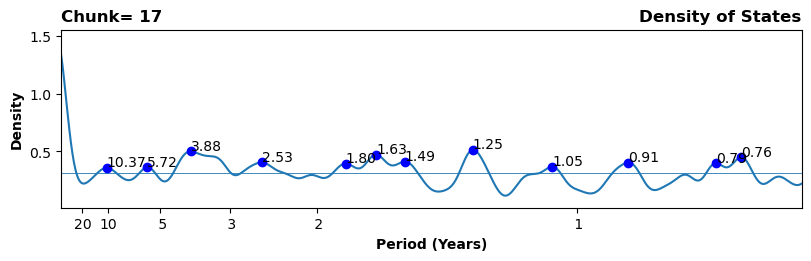

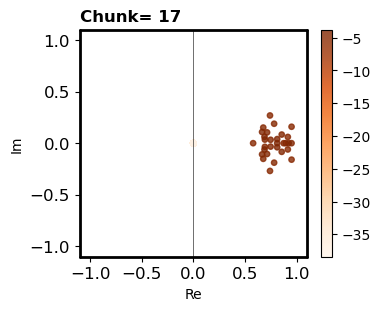

18
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.24614376116199 for a  11626.948876895562 and sigma 76.24614376116199

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



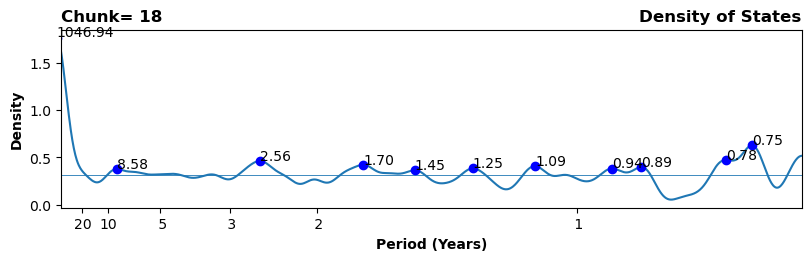

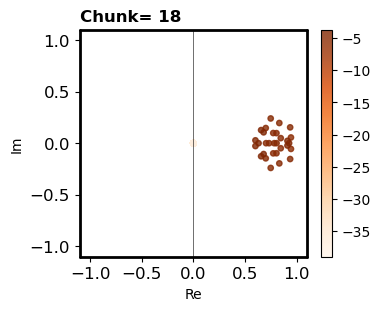

19
Created Koopman Estimator 
 for 1199 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.79316490817105 for a  13055.070991757844 and sigma 80.79316490817105

Computed Transfer Eigenvalues
Computed Kmodes (1199, 30) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 30 vv  1199 1199 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



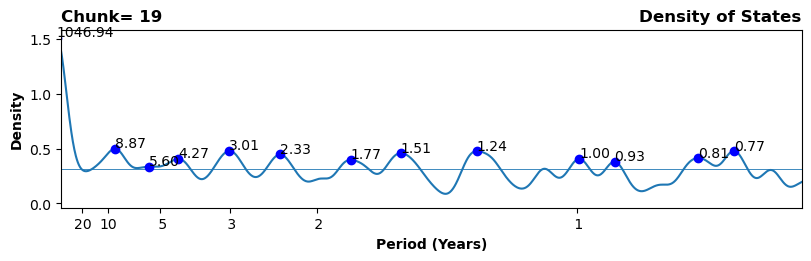

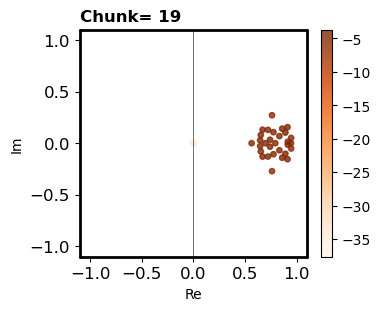

In [32]:
inverse = zkop.one_over_years
bandw =  0.01
encode_svd=True
tot_points=np.zeros((4000,20))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*1200:1200+nchunk*1200]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='right',**ftitle)
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)
    
    
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(3.7,3),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=15
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.4)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 10)
    ax.set_ylabel('Im',fontsize = 10)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)  
    plt.show()


### Poly ALL EOFs (Prova per Matt)

In [25]:
PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_100_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[ 93.92169863,  90.74941267,  95.57085161,  85.89155872,
         88.44491823, 100.39123986,  90.56996597,  81.83153122,
         92.98262197,  88.70057989,  92.39564315,  92.57396192,
         86.37603794,  87.70898446,  91.56364195, 102.0955315 ,
         87.44955303,  90.07982196,  85.78521033,  94.34046872],
       [ 80.61909321,  77.28596733,  80.48925158,  75.91177601,
         77.39431409,  80.60780582,  77.34711231,  75.59949428,
         76.902306  ,  77.13250827,  79.20128704,  79.41600965,
         76.53976329,  76.96282605,  79.3040024 ,  84.88129084,
         76.70405456,  78.41371873,  76.24614376,  80.79316491]])

0
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.61909321416101 for a  12998.876381347165 and sigma 80.61909321416101

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



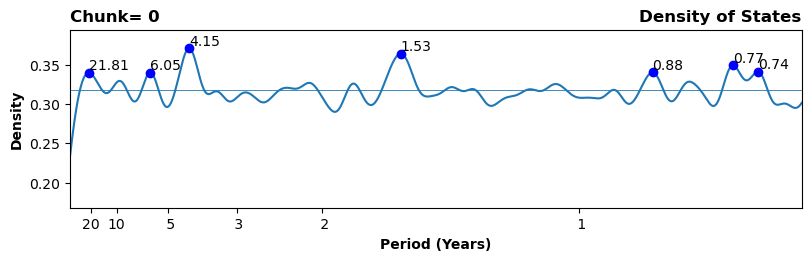

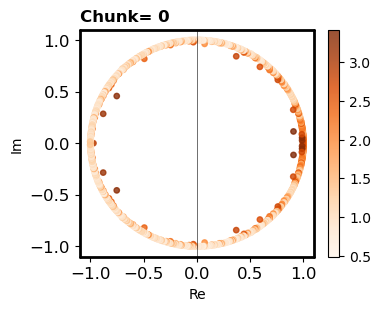

1
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.28596733235378 for a  11946.24149299531 and sigma 77.28596733235378

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



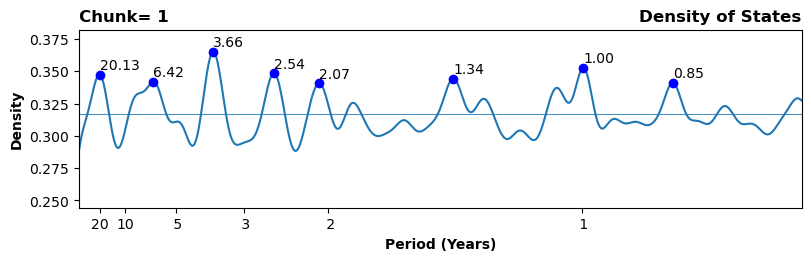

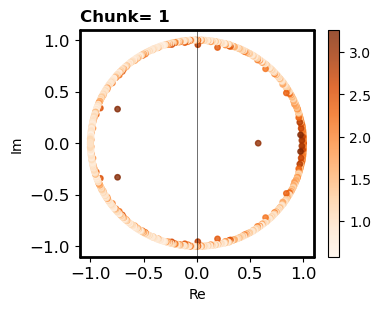

2
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.48925158349809 for a  12957.039240943299 and sigma 80.48925158349809

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



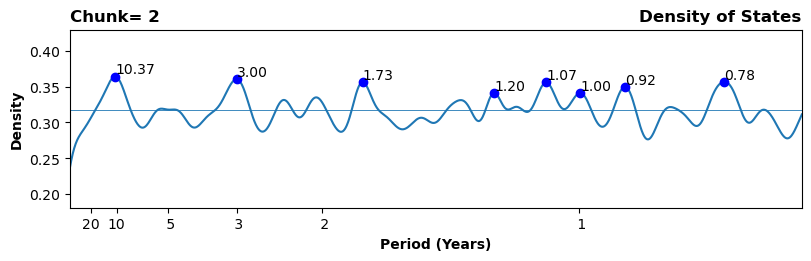

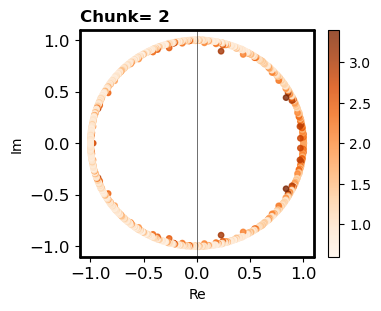

3
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.9117760103274 for a  11525.195474084238 and sigma 75.9117760103274

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



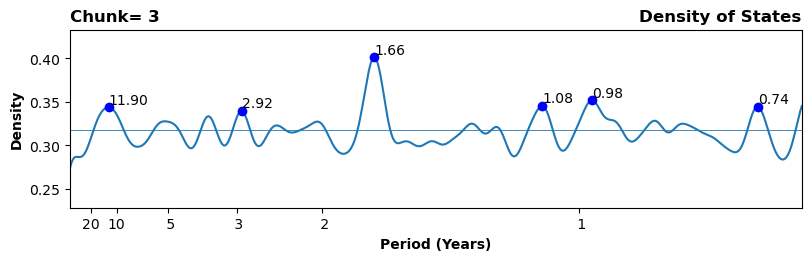

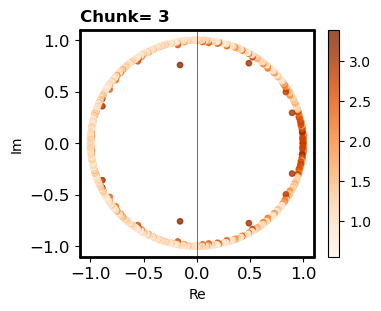

4
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.39431408990386 for a  11979.759706893381 and sigma 77.39431408990386

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



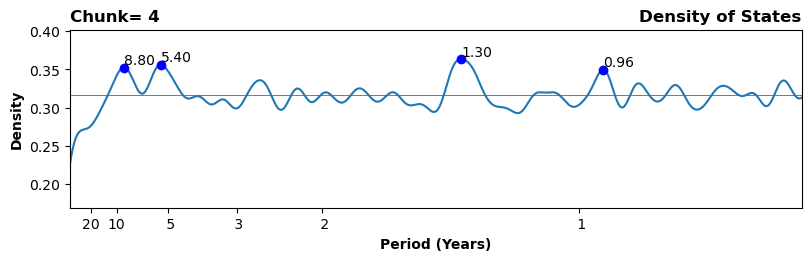

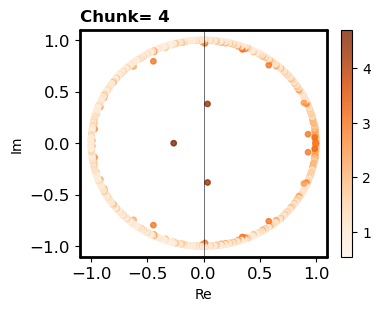

5
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.6078058245774 for a  12995.236719705548 and sigma 80.6078058245774

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



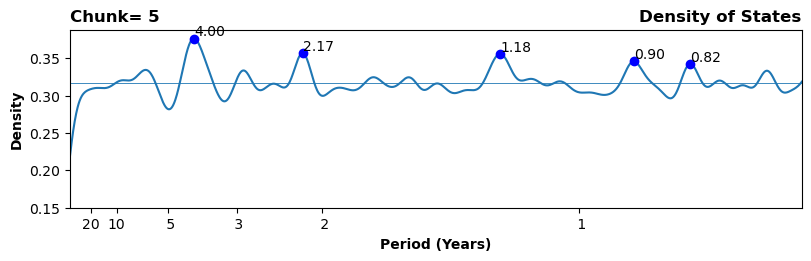

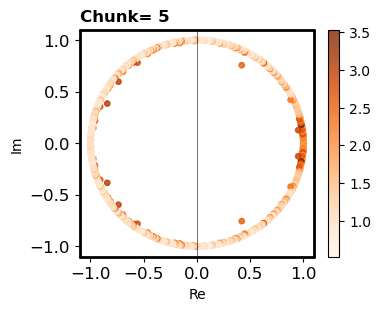

6
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.34711230917821 for a  11965.151565137256 and sigma 77.34711230917821

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



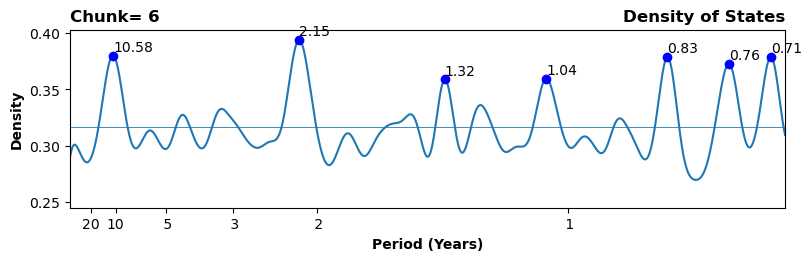

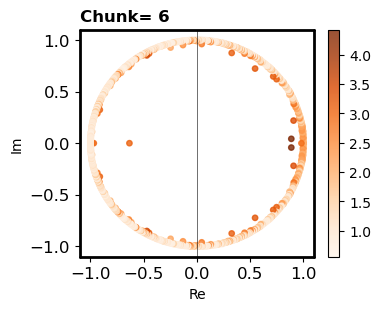

7
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 75.59949427828465 for a  11430.567070264788 and sigma 75.59949427828465

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



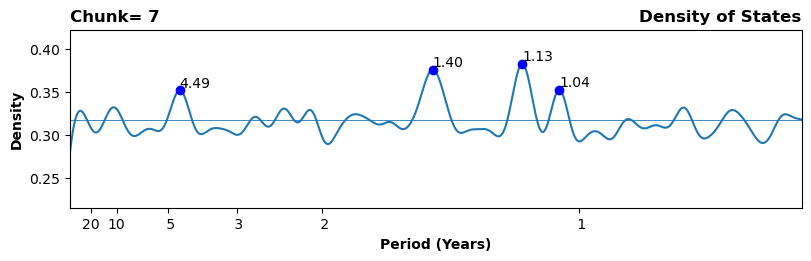

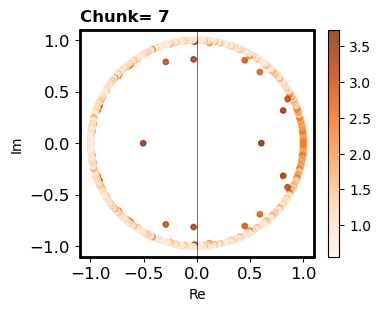

8
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.90230599685924 for a  11827.929335269146 and sigma 76.90230599685924

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



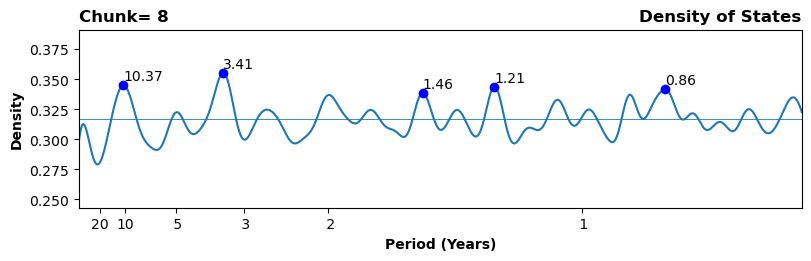

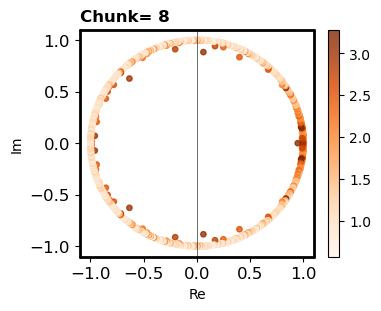

9
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.13250827468535 for a  11898.847665488807 and sigma 77.13250827468535

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



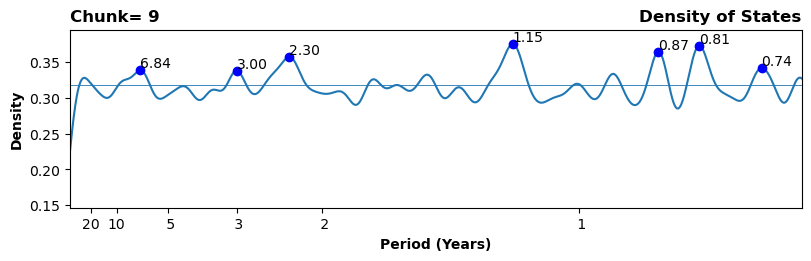

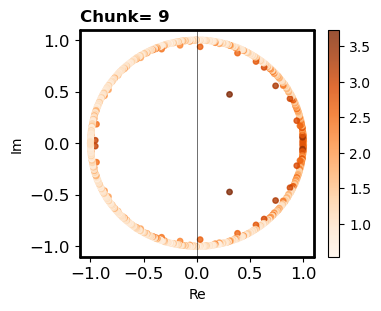

10
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.2012870411596 for a  12545.687737952312 and sigma 79.2012870411596

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



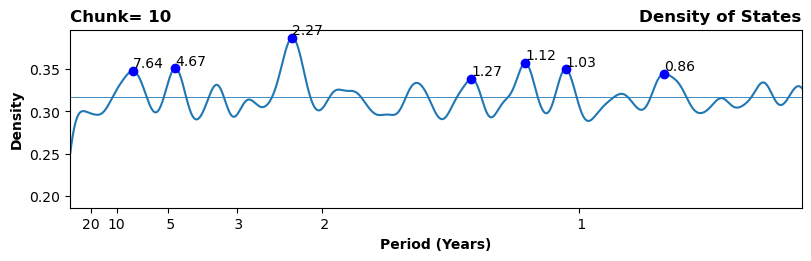

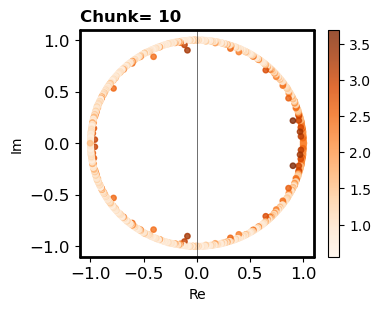

11
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.41600964735899 for a  12613.805176618833 and sigma 79.41600964735899

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



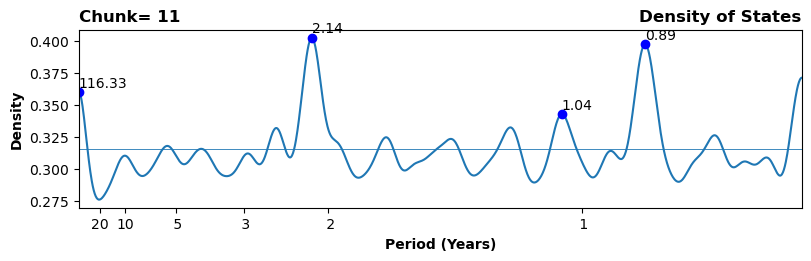

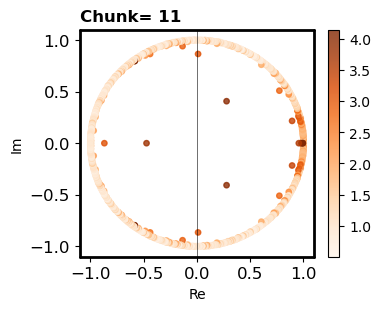

12
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.5397632862058 for a  11716.670727816834 and sigma 76.5397632862058

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



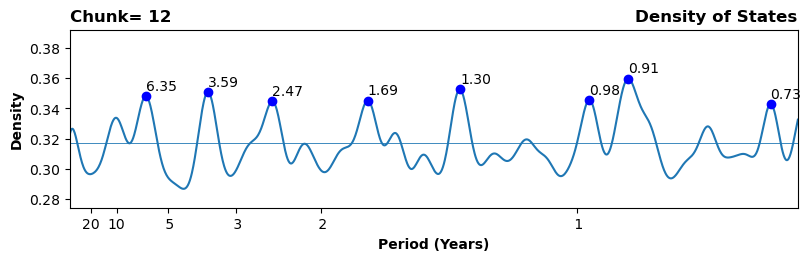

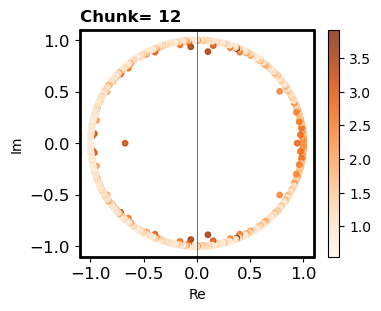

13
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.96282605343755 for a  11846.553188263373 and sigma 76.96282605343755

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



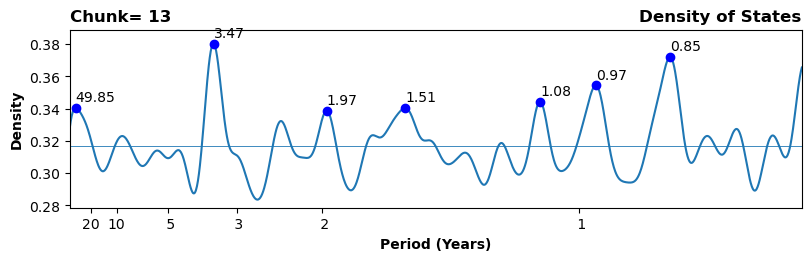

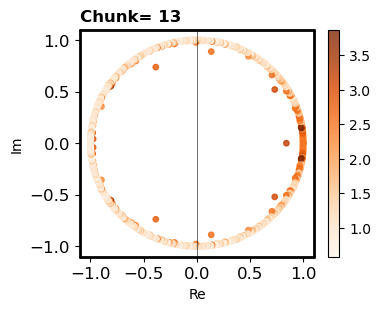

14
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.3040024041893 for a  12578.249594647326 and sigma 79.3040024041893

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



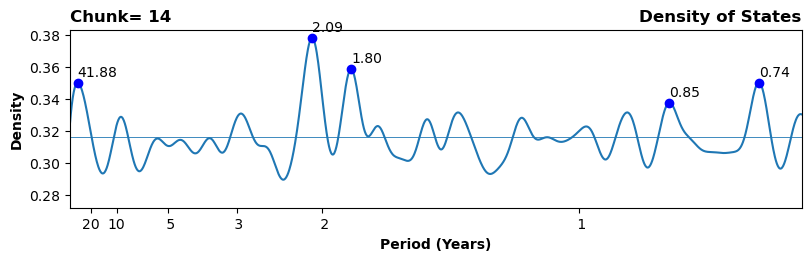

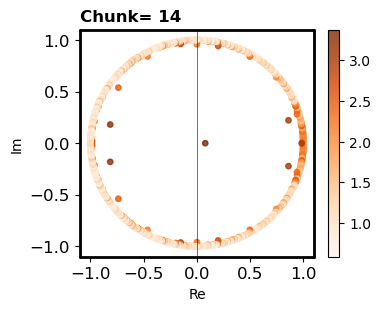

15
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 84.88129083948618 for a  14409.667069154882 and sigma 84.88129083948618

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



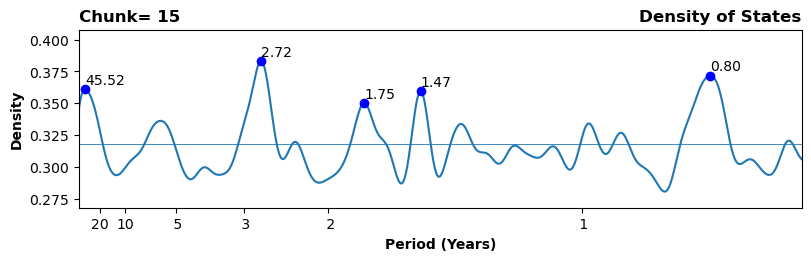

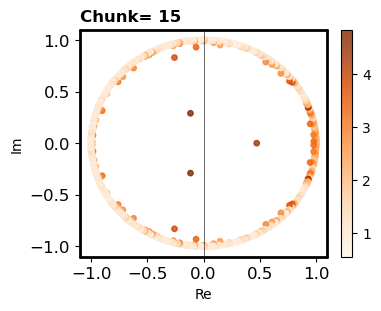

16
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.70405455998205 for a  11767.023971881408 and sigma 76.70405455998205

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



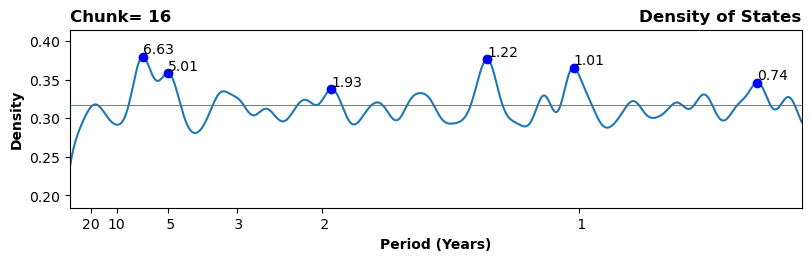

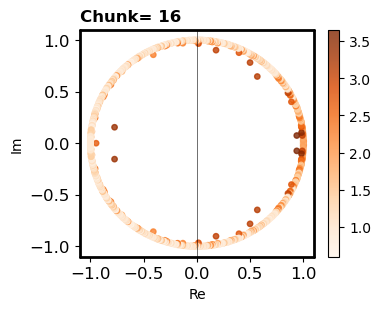

17
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.41371872798643 for a  12297.422569503542 and sigma 78.41371872798643

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



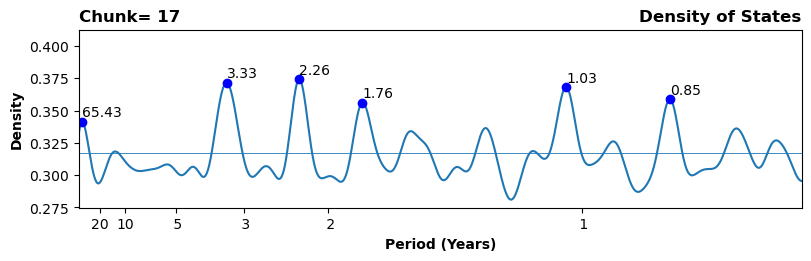

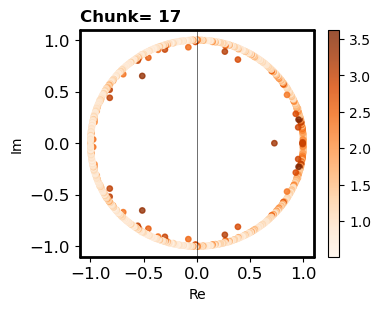

18
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.24614376116199 for a  11626.948876895562 and sigma 76.24614376116199

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



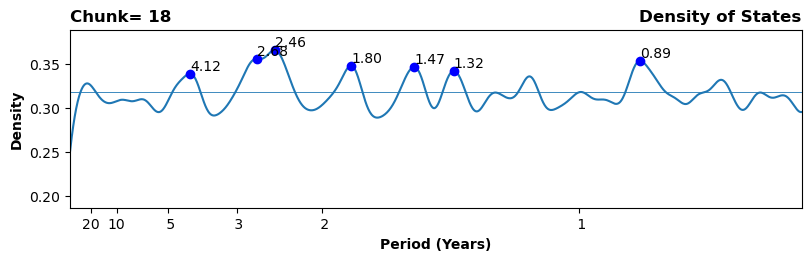

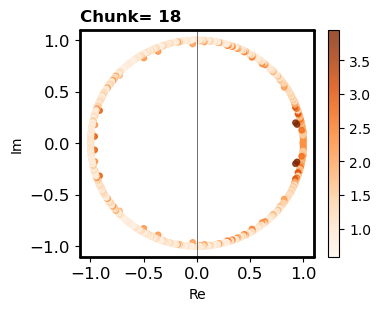

19
Created Koopman Estimator 
 for 1199 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 80.79316490817105 for a  13055.070991757844 and sigma 80.79316490817105

Computed Transfer Eigenvalues
Computed Kmodes (1199, 1845) for (1199, 1199) normalized eigenfunctions
Computed Kmodes 1199 1845 vv  1199 1199 eigenfunctions
Rank of V matrix 1199

 `find_norm_modes` Retain only positive frequencies or zero 



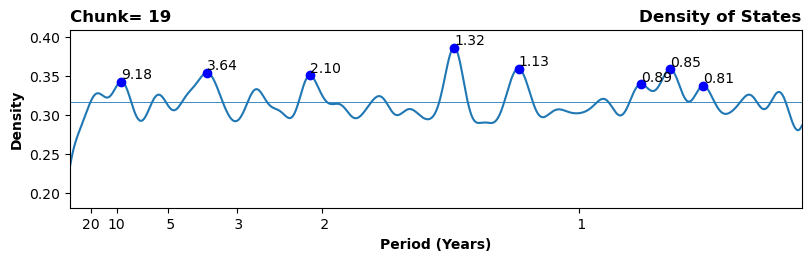

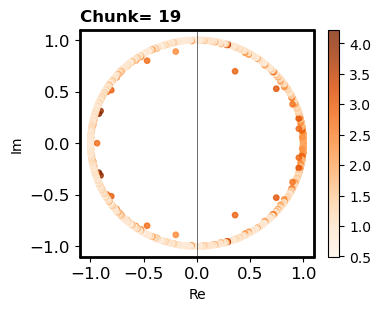

In [26]:
inverse = zkop.one_over_years
bandw =  0.01
encode_svd=True
tot_points=np.zeros((4000,20))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*1200:1200+nchunk*1200]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='right',**ftitle)
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)
    
    
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(3.7,3),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=15
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.4)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 10)
    ax.set_ylabel('Im',fontsize = 10)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    ax.set_title(f'Chunk= {nchunk}',loc='left',**ftitle)  
    plt.show()


# Compute Koopman operators 200 (10)

In [58]:
chunks=[0,1,2,3,4,5,6,7,8,9]
chunks

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

### ALL EOFs

In [59]:
encode_svd=True

In [60]:
PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_200_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[93.80633298, 95.16960767, 93.08680321, 88.40284784, 97.17030965,
        97.7473866 , 88.33375675, 89.70227799, 92.64266216, 91.95142417,
        93.89485017, 91.29046959, 88.68030836, 91.1536316 , 99.14501049,
        97.75033771, 90.19200523, 89.36326157, 91.66399488],
       [93.41153356, 93.1435683 , 92.55429293, 91.2354061 , 93.81177031,
        93.72119642, 91.46703353, 91.06981672, 91.83335021, 92.70160546,
        93.85099951, 92.74950191, 91.62240406, 92.52923216, 96.18267932,
        95.12184566, 92.16474668, 91.76304711, 92.7513015 ]])

0
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



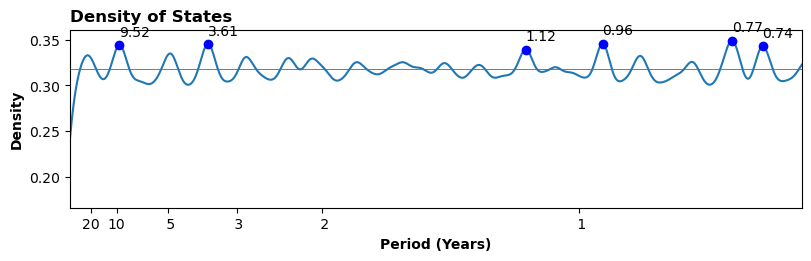

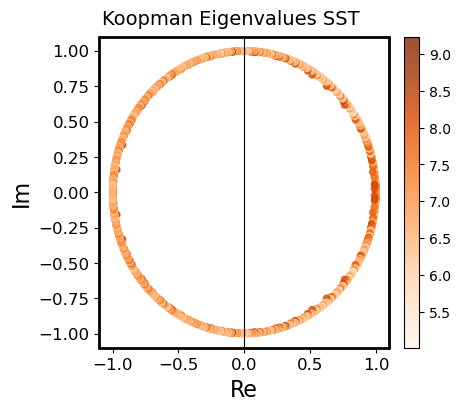

1
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



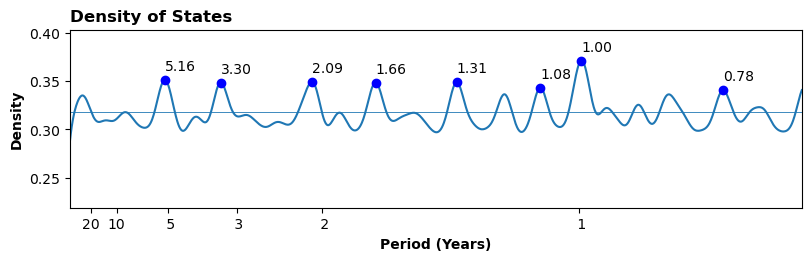

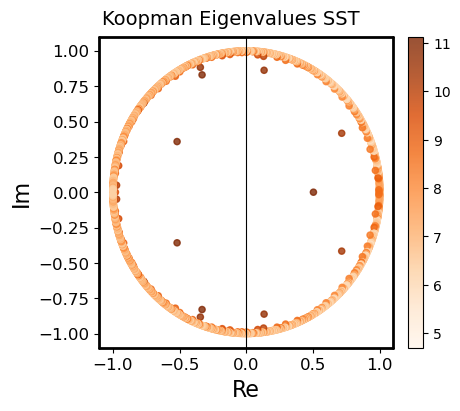

2
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



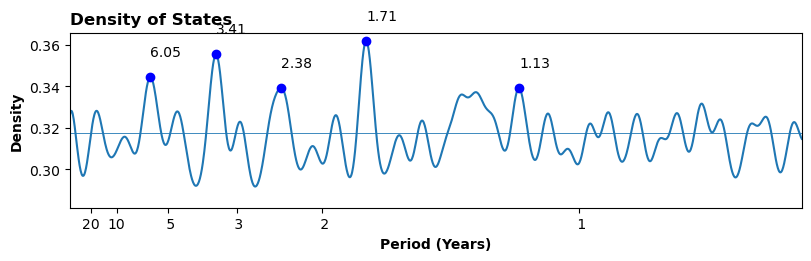

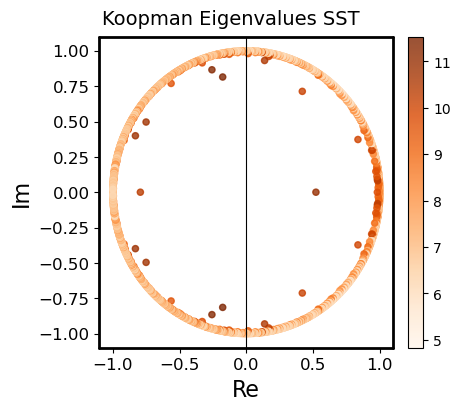

3
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



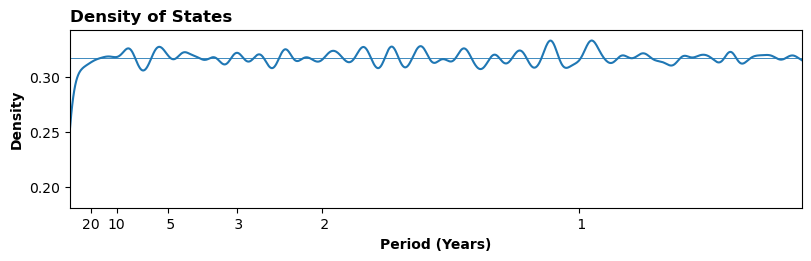

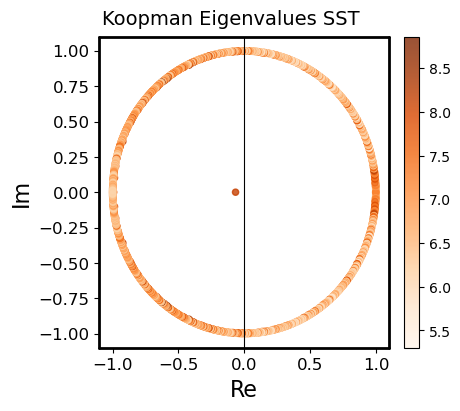

4
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



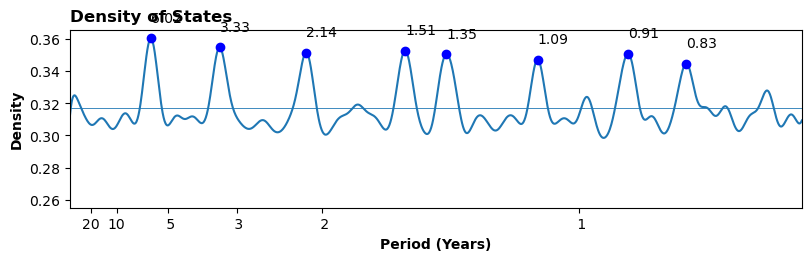

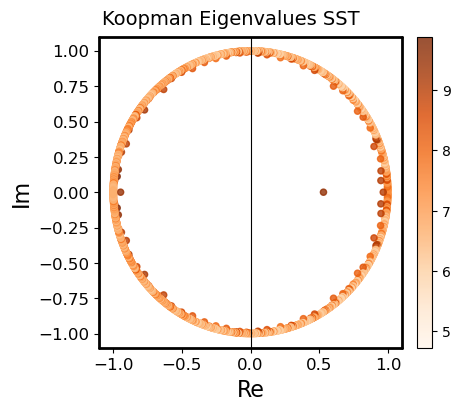

5
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



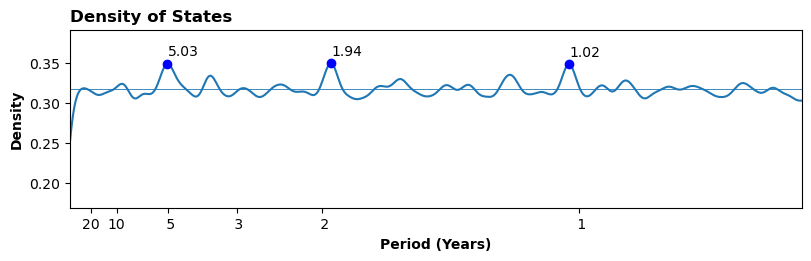

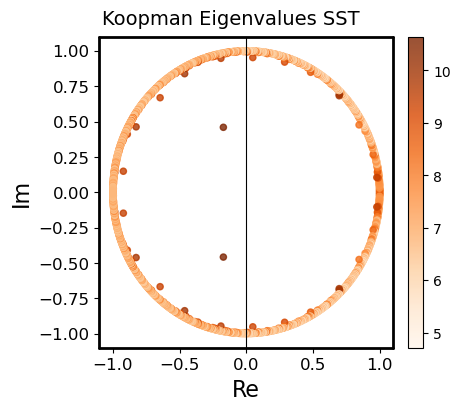

6
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



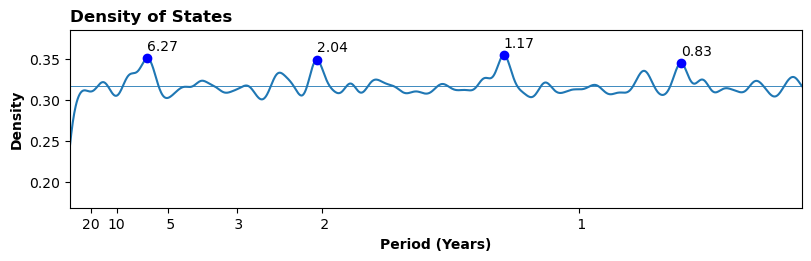

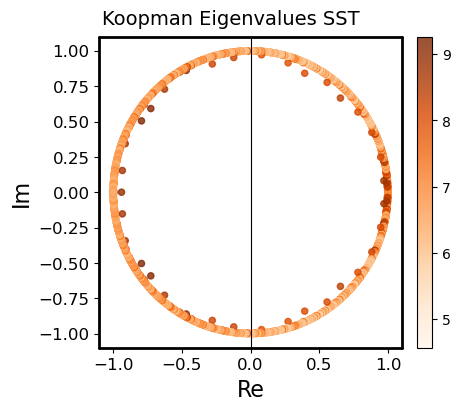

7
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



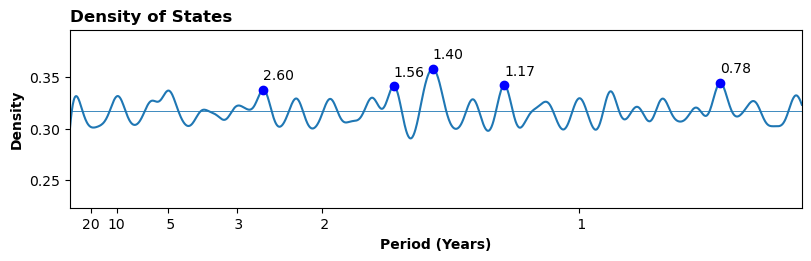

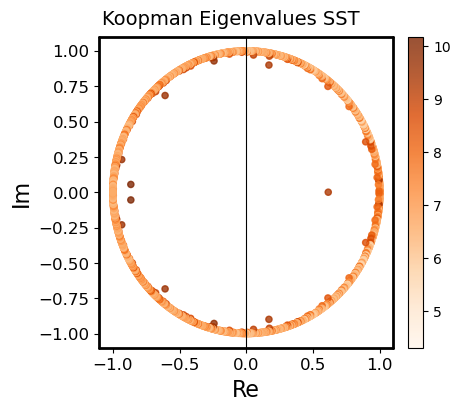

8
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



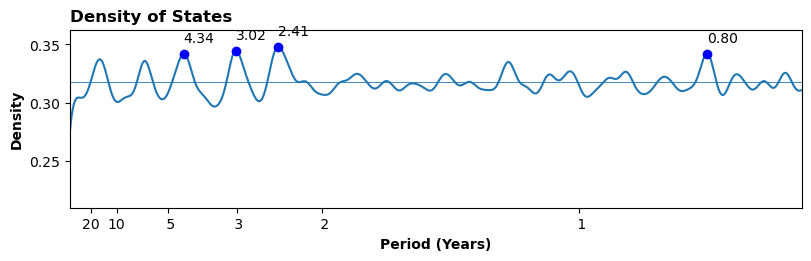

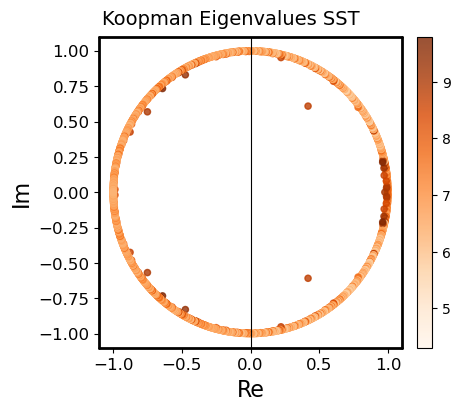

9
Created Koopman Estimator 
 for 2399 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 1845) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 1845 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



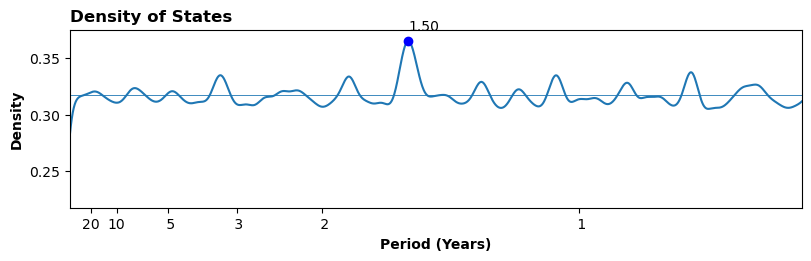

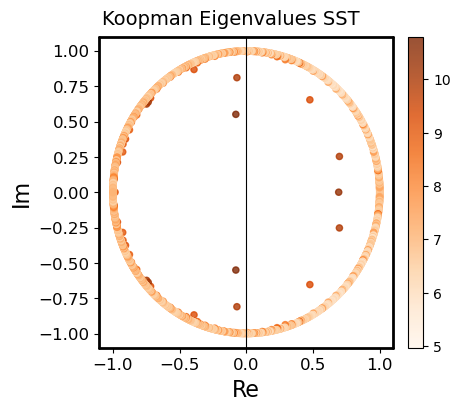

In [61]:
inverse = zkop.one_over_years
bandw =  0.0075
encode_svd=True
tot_points=np.zeros((4000,10))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*2400:2400+nchunk*2400]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,0])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()


### 30 EOFs

In [62]:
encode_svd=True

In [63]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_200_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[92.38029631, 93.179204  , 91.2517583 , 87.05437754, 95.19771707,
        95.67399639, 86.64150395, 87.86048189, 91.00450213, 90.61649173,
        92.32742607, 89.89501526, 87.26928663, 89.5219952 , 97.22115957,
        95.79437587, 88.70752845, 88.02224561, 90.22449042],
       [79.27160676, 79.07826288, 78.43079495, 76.84367136, 79.42273109,
        79.20133615, 76.85555886, 76.52120306, 77.3589659 , 78.46272628,
        79.66051815, 78.26031214, 77.05824463, 78.31246353, 82.33823356,
        81.00864239, 77.75872442, 77.57576041, 78.71547674]])

0
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.27160676467886 for a  12567.97527810776 and sigma 79.27160676467886

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



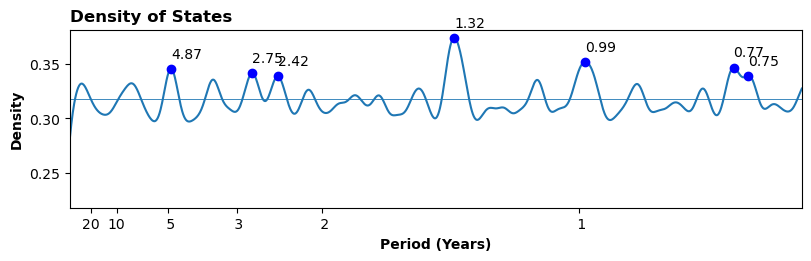

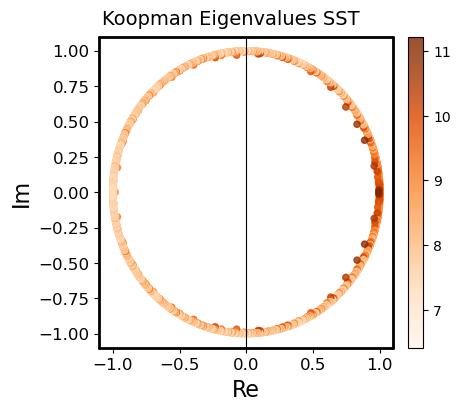

1
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.07826288418244 for a  12506.74332155973 and sigma 79.07826288418244

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



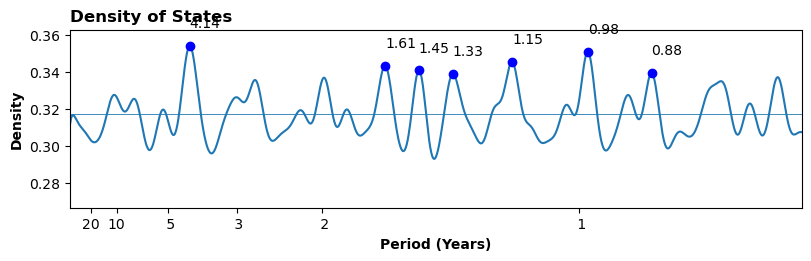

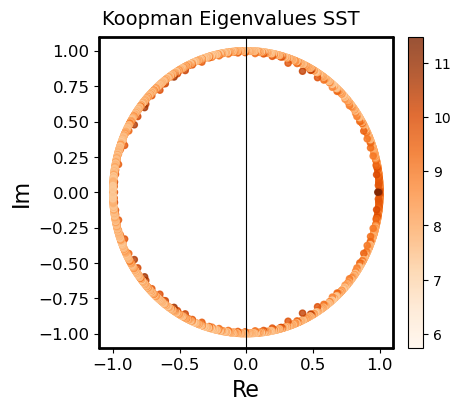

2
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.4307949487619 for a  12302.77919258947 and sigma 78.4307949487619

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



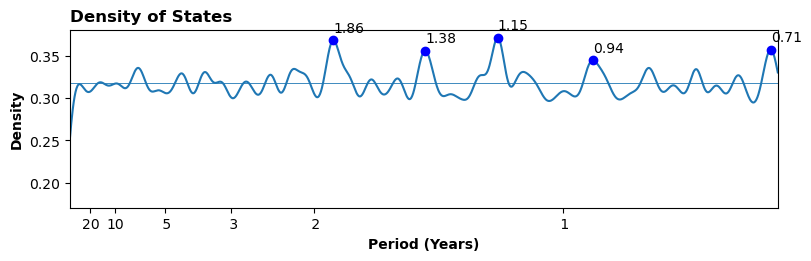

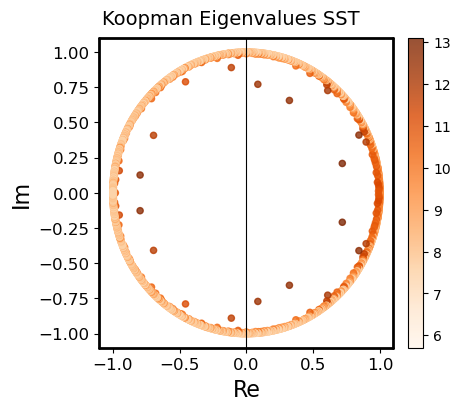

3
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.8436713593111 for a  11809.899655955618 and sigma 76.8436713593111

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



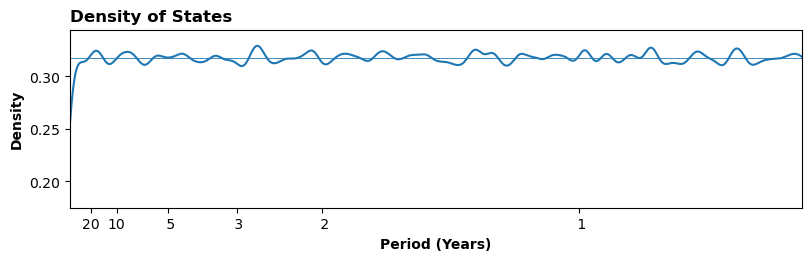

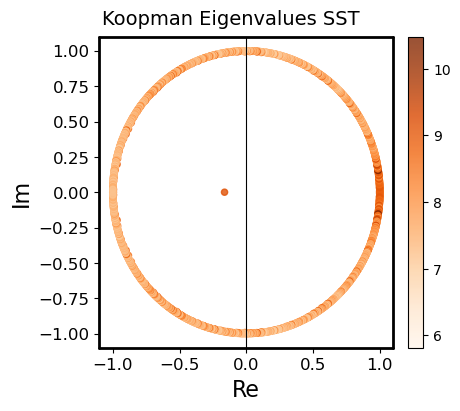

4
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.42273108960202 for a  12615.940427462472 and sigma 79.42273108960202

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



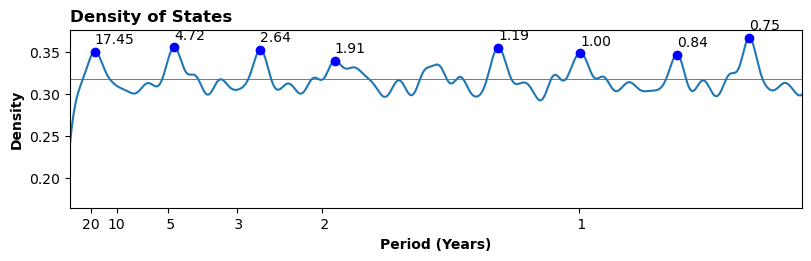

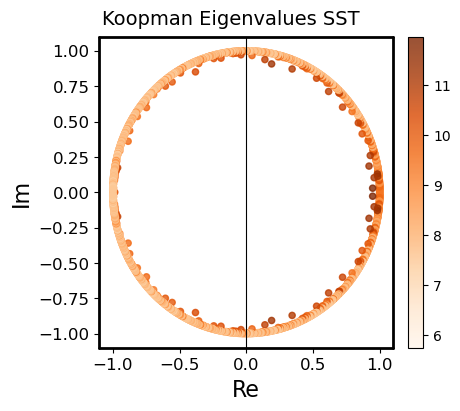

5
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.2013361469487 for a  12545.703294923927 and sigma 79.2013361469487

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



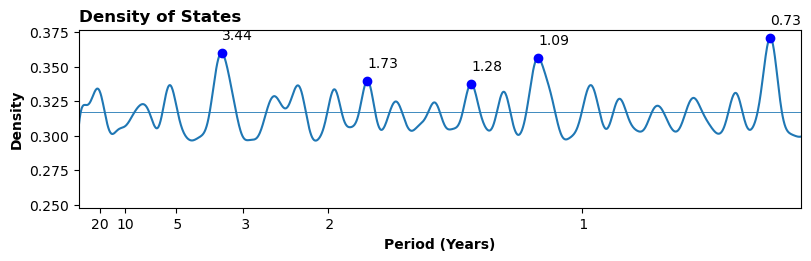

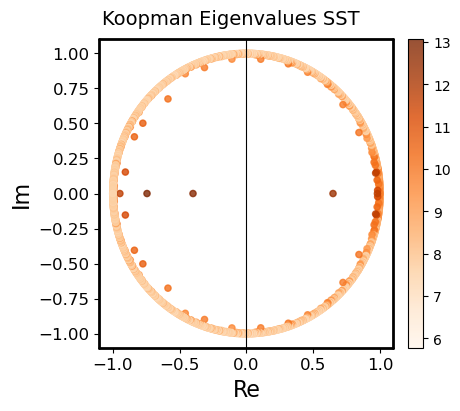

6
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.85555886051667 for a  11813.553855524684 and sigma 76.85555886051667

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



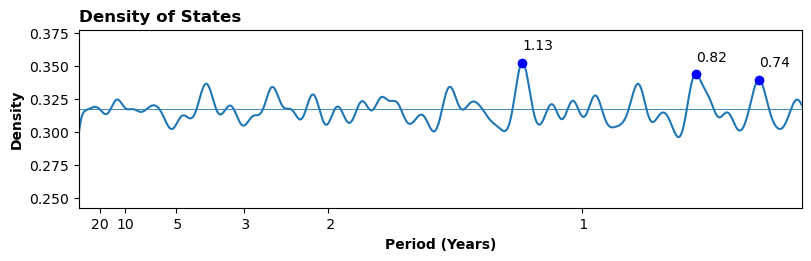

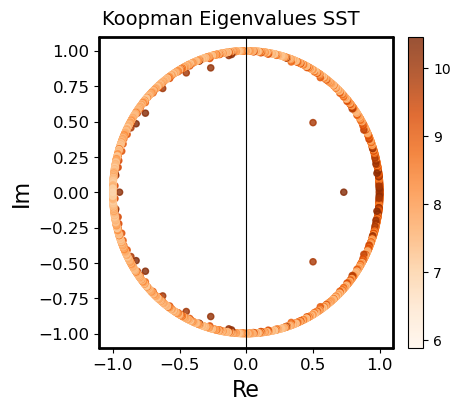

7
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 76.52120305765615 for a  11710.989034782091 and sigma 76.52120305765615

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



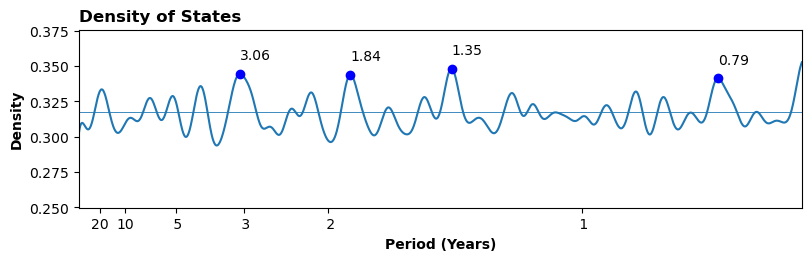

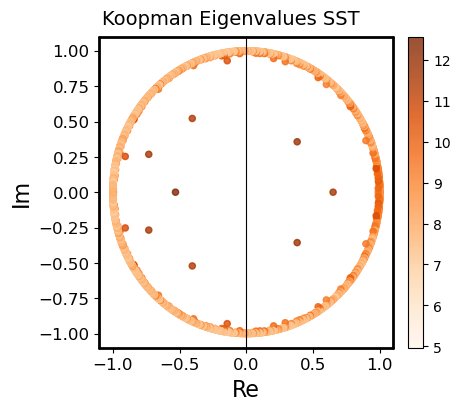

8
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.35896590040412 for a  11968.819210359774 and sigma 77.35896590040412

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



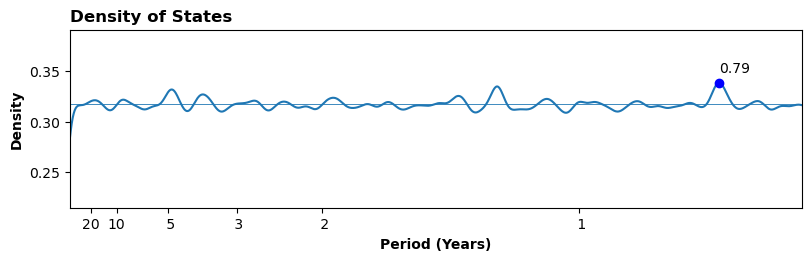

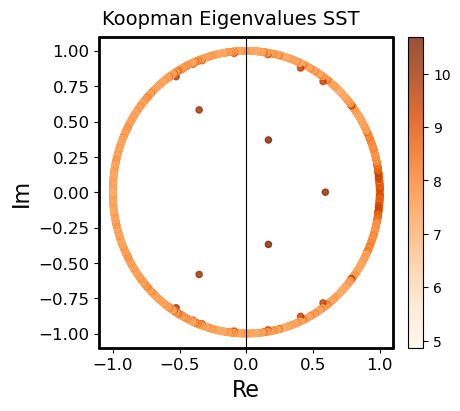

9
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.46272627649108 for a  12312.798829479128 and sigma 78.46272627649108

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



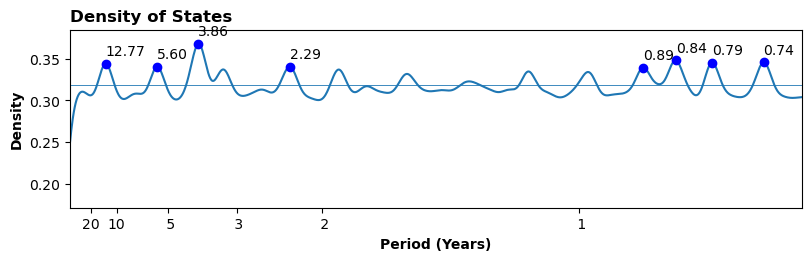

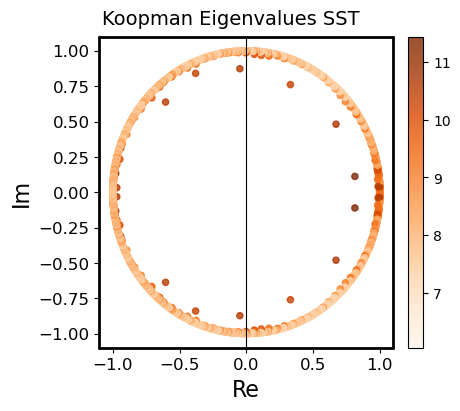

In [64]:
inverse = zkop.one_over_years
bandw =  0.0075
encode_svd=True
tot_points=np.zeros((4000,10))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*2400:2400+nchunk*2400]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()


### POLY EOFs

In [65]:
encode_svd=True

In [66]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_200_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[93.80633298, 95.16960767, 93.08680321, 88.40284784, 97.17030965,
        97.7473866 , 88.33375675, 89.70227799, 92.64266216, 91.95142417,
        93.89485017, 91.29046959, 88.68030836, 91.1536316 , 99.14501049,
        97.75033771, 90.19200523, 89.36326157, 91.66399488],
       [93.41153356, 93.1435683 , 92.55429293, 91.2354061 , 93.81177031,
        93.72119642, 91.46703353, 91.06981672, 91.83335021, 92.70160546,
        93.85099951, 92.74950191, 91.62240406, 92.52923216, 96.18267932,
        95.12184566, 92.16474668, 91.76304711, 92.7513015 ]])

0
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.4115335599269 for a  17451.429204034695 and sigma 93.4115335599269

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



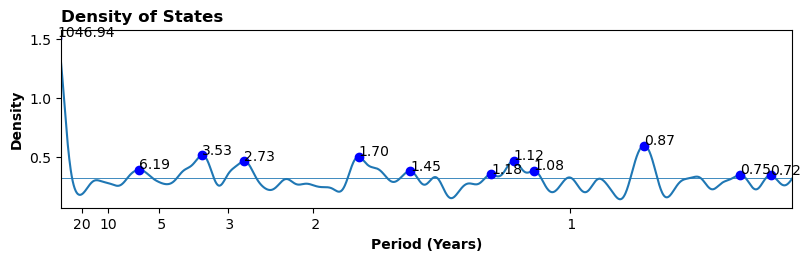

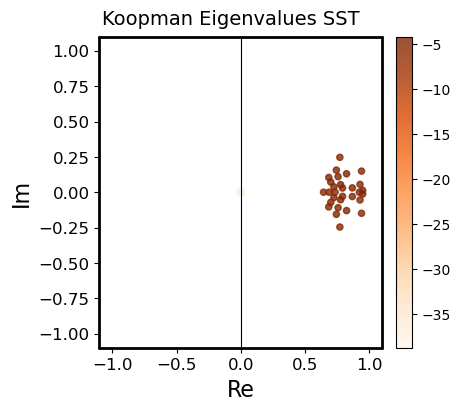

1
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.14356830146681 for a  17351.44863186003 and sigma 93.14356830146681

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



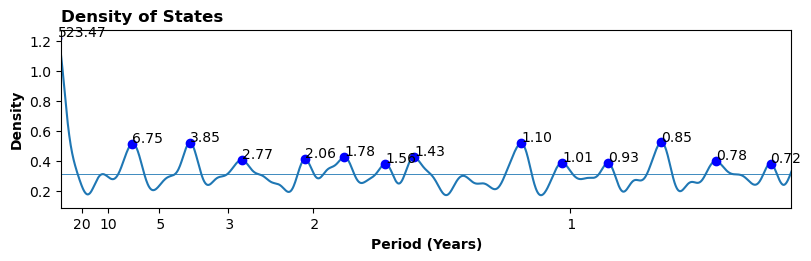

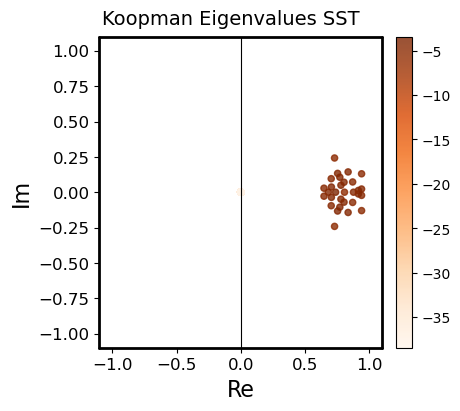

2
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.55429293495577 for a  17132.594281379206 and sigma 92.55429293495577

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



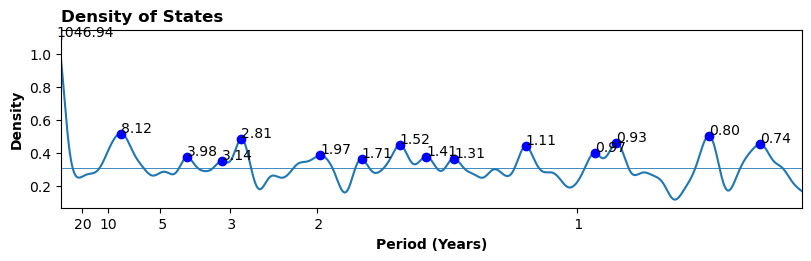

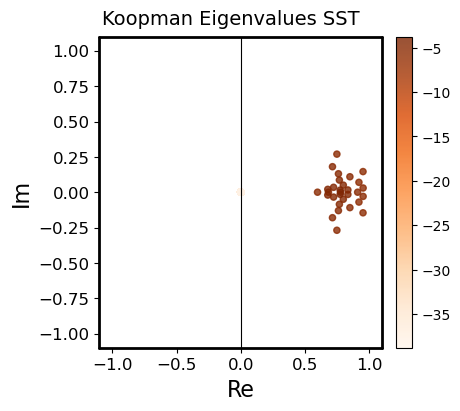

3
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.23540610055079 for a  16647.798652664842 and sigma 91.23540610055079

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



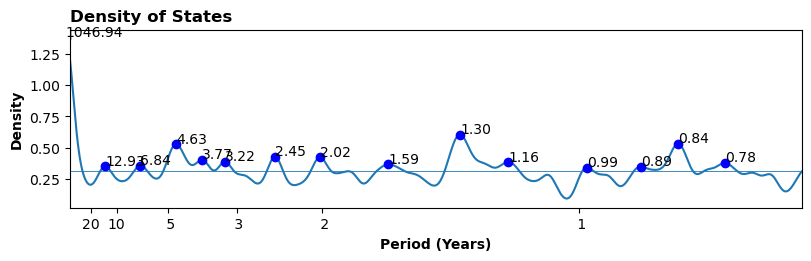

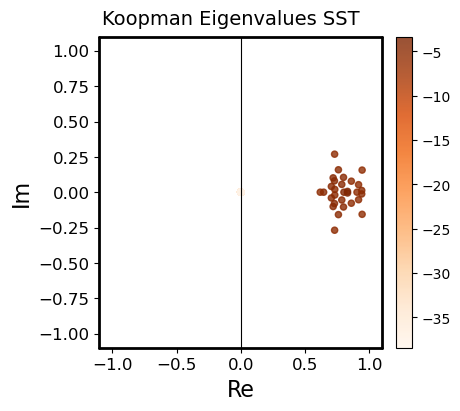

4
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.81177031200465 for a  17601.296498144635 and sigma 93.81177031200465

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



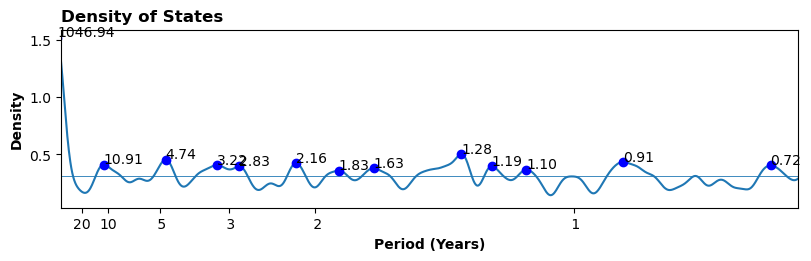

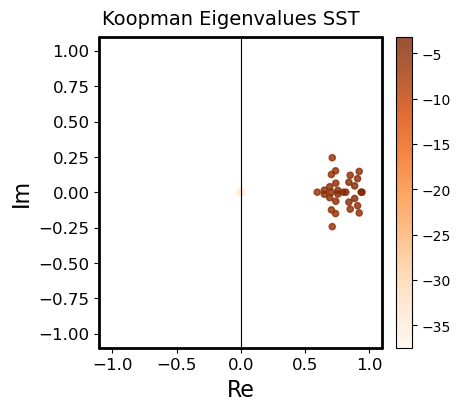

5
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.7211964168394 for a  17567.325315607584 and sigma 93.7211964168394

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



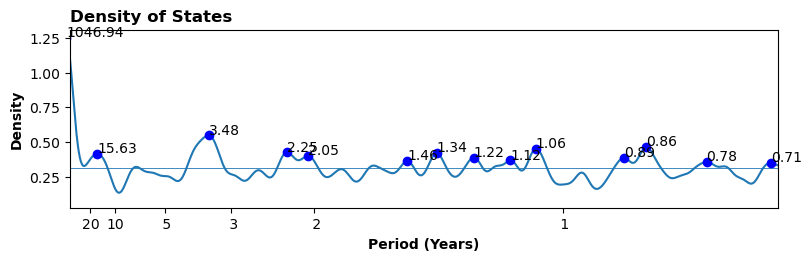

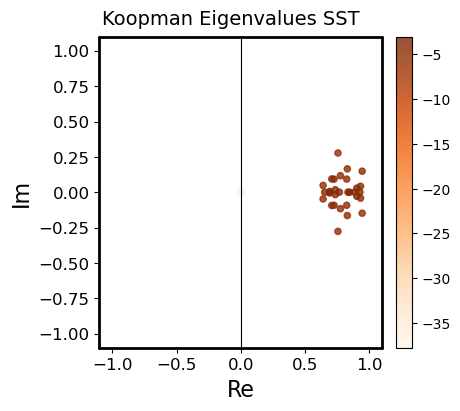

6
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.46703353054146 for a  16732.43644575439 and sigma 91.46703353054146

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



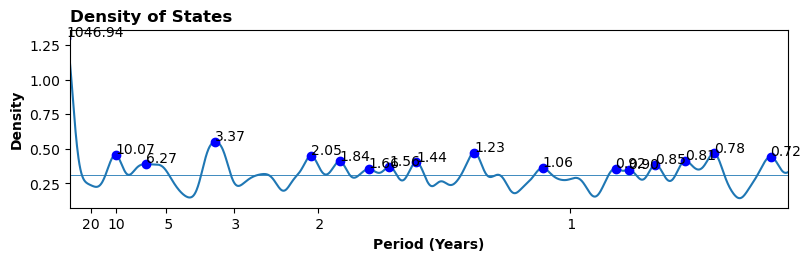

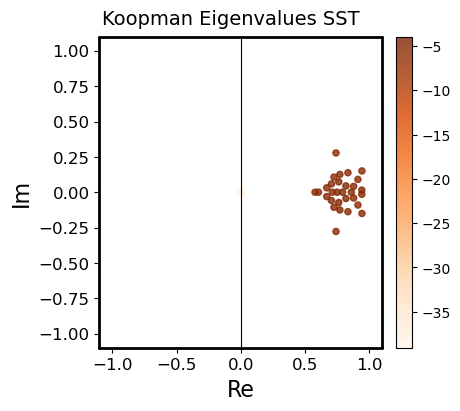

7
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.06981672056911 for a  16587.423035036096 and sigma 91.06981672056911

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



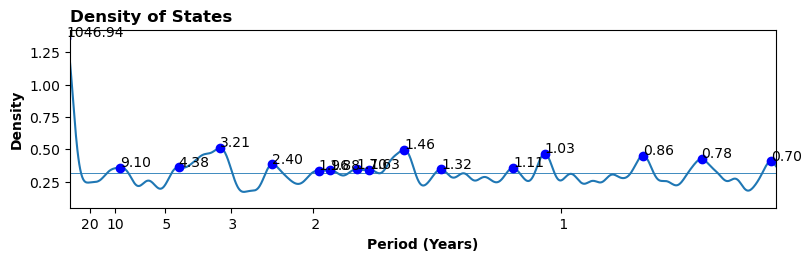

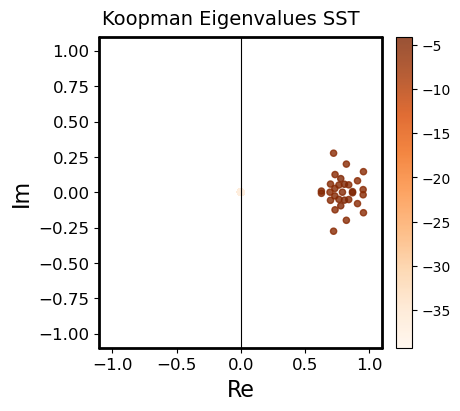

8
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.83335021208022 for a  16866.728422349148 and sigma 91.83335021208022

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



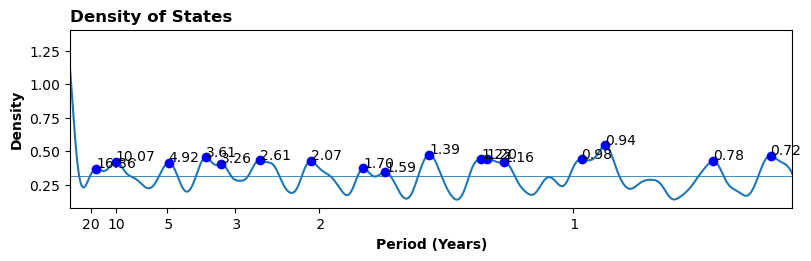

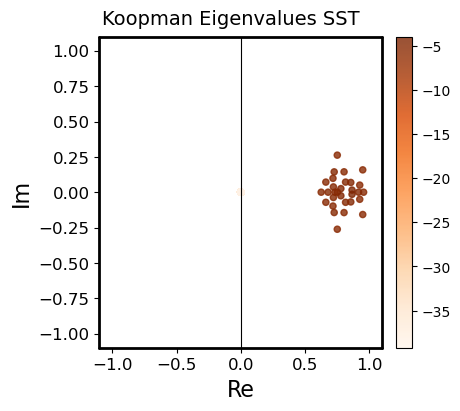

9
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.70160546490722 for a  17187.175311542633 and sigma 92.70160546490722

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



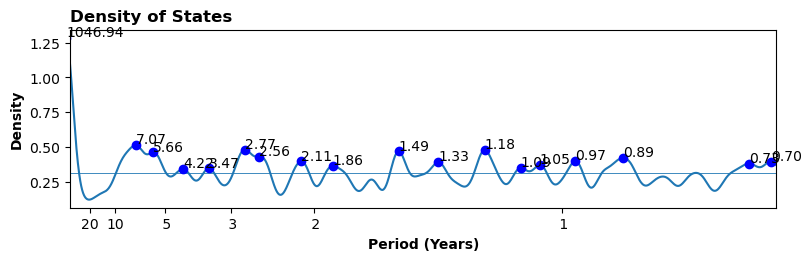

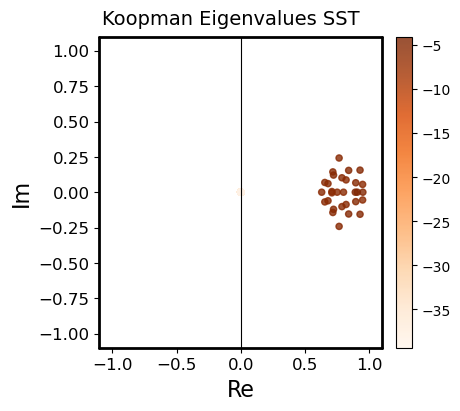

In [67]:
inverse = zkop.one_over_years
bandw =  0.0075
encode_svd=True
tot_points=np.zeros((4000,10))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*2400:2400+nchunk*2400]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()


# Compute Koopman operators 400 (5)

In [18]:
chunks=[0,1,2,3,4]
chunks

[0, 1, 2, 3, 4]

### ALL EOFs

In [19]:
encode_svd=True

In [20]:
PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_400_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[93.40458702, 95.15393745, 92.98950503, 90.37258401, 93.23744512,
        91.32200821, 94.29144314, 95.00244566, 91.00962704],
       [93.11237827, 93.29724203, 92.83692965, 91.83892855, 92.95264628,
        92.86077142, 93.98452113, 94.26339349, 92.64237627]])

0
Created Koopman Estimator 
 for 4799 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.11237826909195 for a  17339.82997385293 and sigma 93.11237826909195

Computed Transfer Eigenvalues
Computed Kmodes (4799, 1845) for (4799, 4799) normalized eigenfunctions
Computed Kmodes 4799 1845 vv  4799 4799 eigenfunctions
Rank of V matrix 4799

 `find_norm_modes` Retain only positive frequencies or zero 



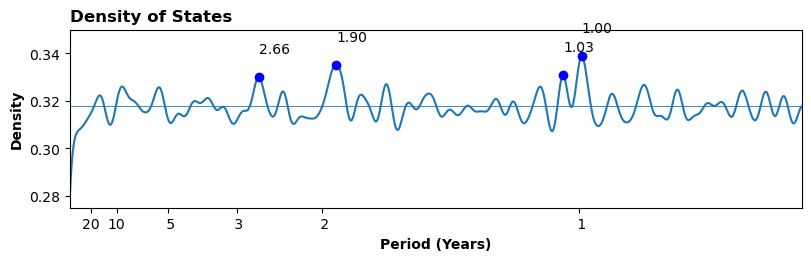

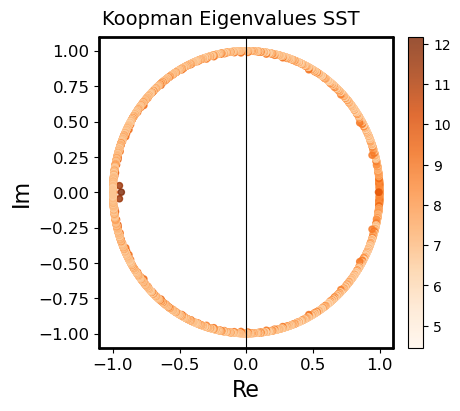

1
Created Koopman Estimator 
 for 4799 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.297242031909 for a  17408.750741521213 and sigma 93.297242031909

Computed Transfer Eigenvalues
Computed Kmodes (4799, 1845) for (4799, 4799) normalized eigenfunctions
Computed Kmodes 4799 1845 vv  4799 4799 eigenfunctions
Rank of V matrix 4799

 `find_norm_modes` Retain only positive frequencies or zero 



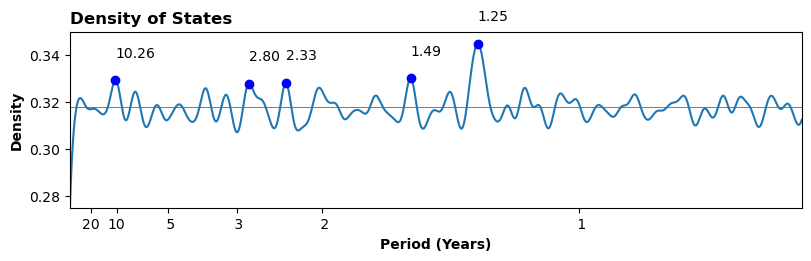

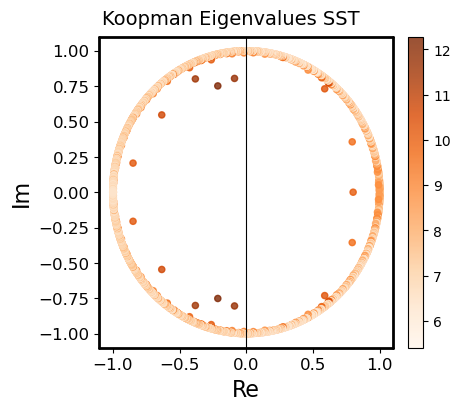

2
Created Koopman Estimator 
 for 4799 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.83692964681816 for a  17237.39101249653 and sigma 92.83692964681816

Computed Transfer Eigenvalues
Computed Kmodes (4799, 1845) for (4799, 4799) normalized eigenfunctions
Computed Kmodes 4799 1845 vv  4799 4799 eigenfunctions
Rank of V matrix 4799

 `find_norm_modes` Retain only positive frequencies or zero 



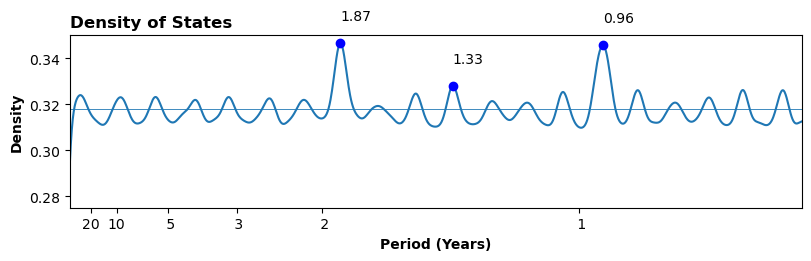

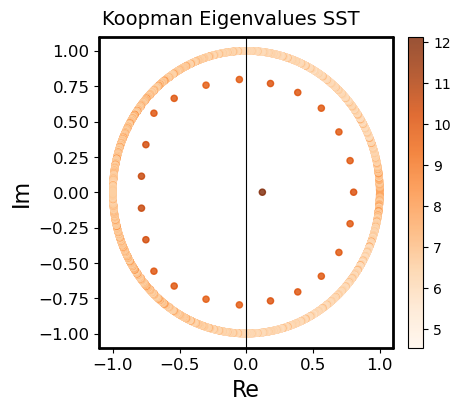

3
Created Koopman Estimator 
 for 4799 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.83892855249807 for a  16868.777595341693 and sigma 91.83892855249807

Computed Transfer Eigenvalues
Computed Kmodes (4799, 1845) for (4799, 4799) normalized eigenfunctions
Computed Kmodes 4799 1845 vv  4799 4799 eigenfunctions
Rank of V matrix 4799

 `find_norm_modes` Retain only positive frequencies or zero 



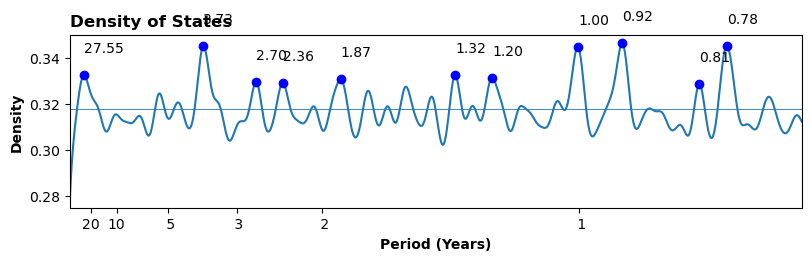

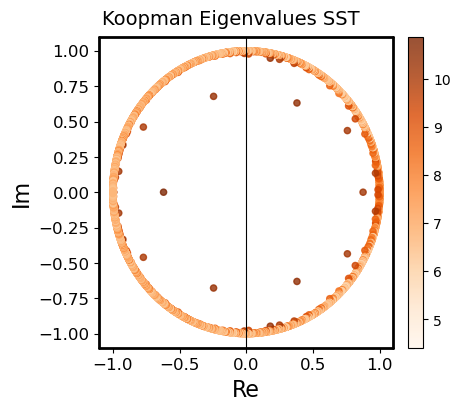

4
Created Koopman Estimator 
 for 4799 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.9526462801449 for a  17280.388900963473 and sigma 92.9526462801449

Computed Transfer Eigenvalues
Computed Kmodes (4799, 1845) for (4799, 4799) normalized eigenfunctions
Computed Kmodes 4799 1845 vv  4799 4799 eigenfunctions
Rank of V matrix 4799

 `find_norm_modes` Retain only positive frequencies or zero 



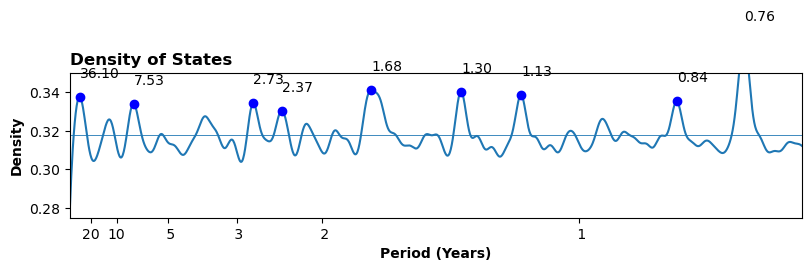

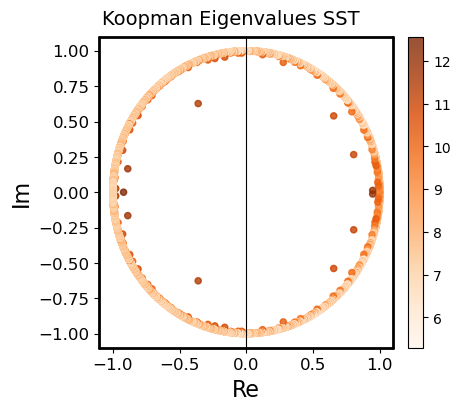

In [22]:
inverse = zkop.one_over_years
bandw =  0.006
encode_svd=True
tot_points=np.zeros((4000,5))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*4800:4800+nchunk*4800]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw,0.01)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    ax.set_ylim(0.275,0.35)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    
    with open(f'Density_400_GALL_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')

    with open(f'Spectra_400_GALL_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()


### 30 EOFs

In [30]:
encode_svd=True

In [31]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_400_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[91.80463001, 93.27685854, 91.19422169, 88.75229937, 91.66973082,
        89.87618821, 92.6201296 , 93.30553145, 89.59362782],
       [78.97448152, 79.01751296, 78.33905894, 77.31605924, 78.61308643,
        78.47812696, 79.78176514, 80.1320885 , 78.41901248]])

0
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.97448152448597 for a  12473.937464122751 and sigma 78.97448152448597

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



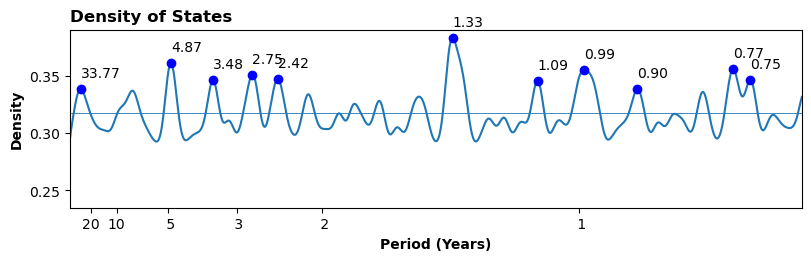

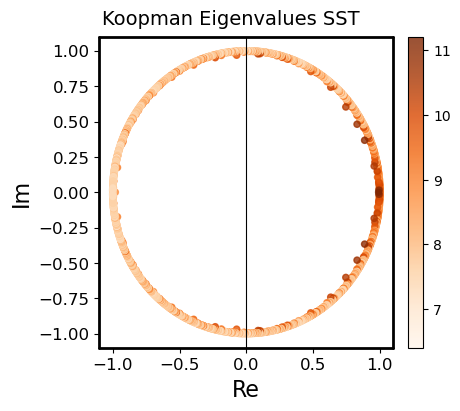

1
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 79.01751295588836 for a  12487.53470746797 and sigma 79.01751295588836

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



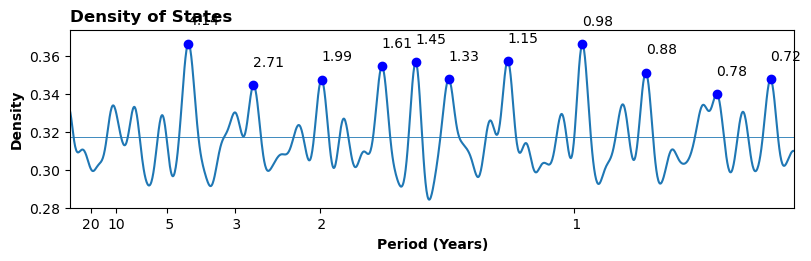

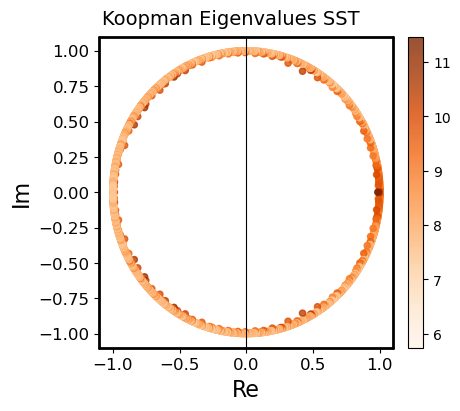

2
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.33905893701383 for a  12274.016310273853 and sigma 78.33905893701383

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



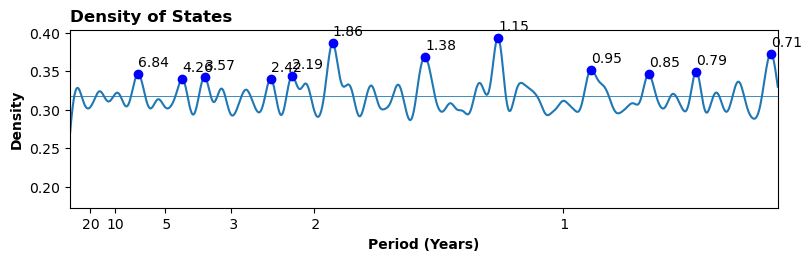

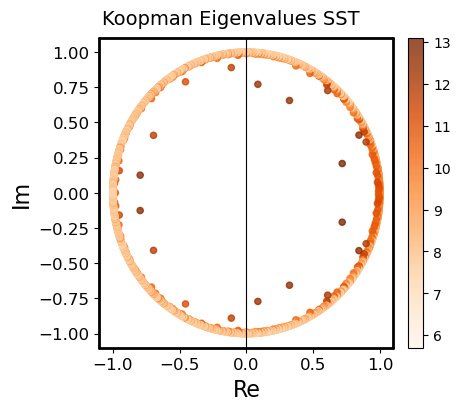

3
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 77.3160592441066 for a  11955.546034076402 and sigma 77.3160592441066

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



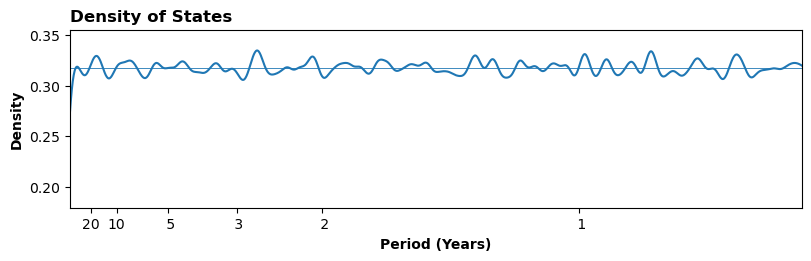

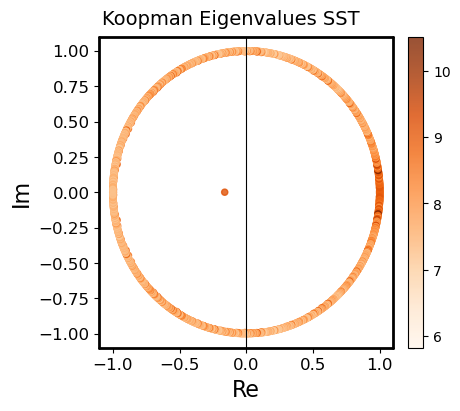

4
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.61308642916377 for a  12360.034715838347 and sigma 78.61308642916377

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 2399

 `find_norm_modes` Retain only positive frequencies or zero 



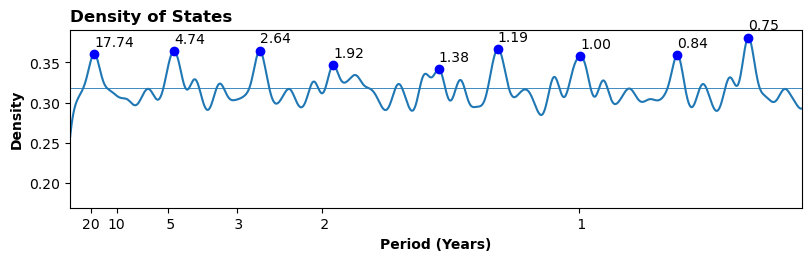

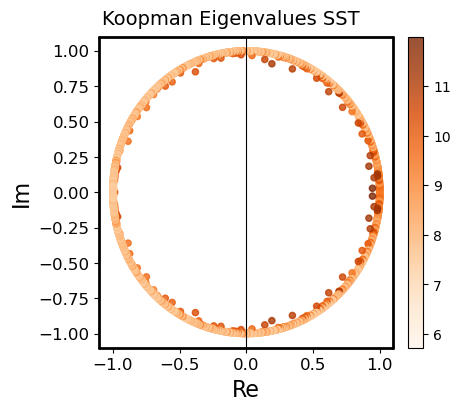

In [32]:
inverse = zkop.one_over_years
bandw =  0.006
encode_svd=True
tot_points=np.zeros((4000,5))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*2400:2400+nchunk*2400]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)

    with open(f'Density_400_G30_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)
    
    
    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')

    with open(f'Spectra_400_G30_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()


### POLY EOFs

In [33]:
encode_svd=True

In [34]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_400_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[93.40458702, 95.15393745, 92.98950503, 90.37258401, 93.23744512,
        91.32200821, 94.29144314, 95.00244566, 91.00962704],
       [93.11237827, 93.29724203, 92.83692965, 91.83892855, 92.95264628,
        92.86077142, 93.98452113, 94.26339349, 92.64237627]])

0
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.11237826909195 for a  17339.82997385293 and sigma 93.11237826909195

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



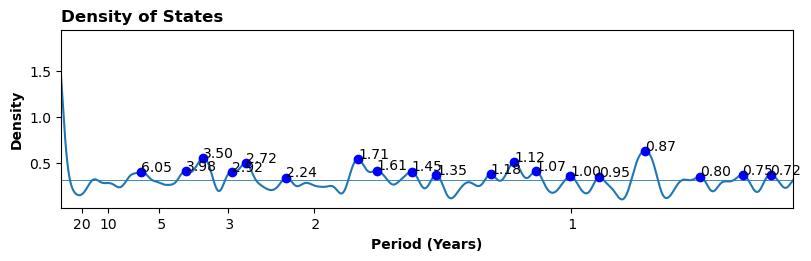

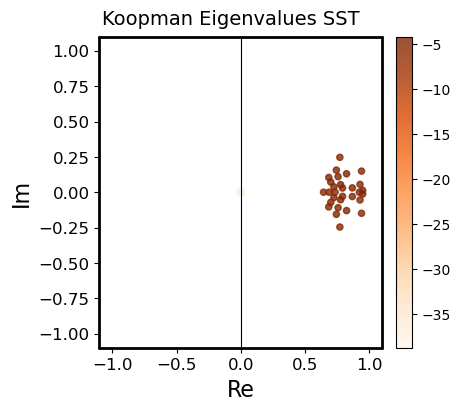

1
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.297242031909 for a  17408.750741521213 and sigma 93.297242031909

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



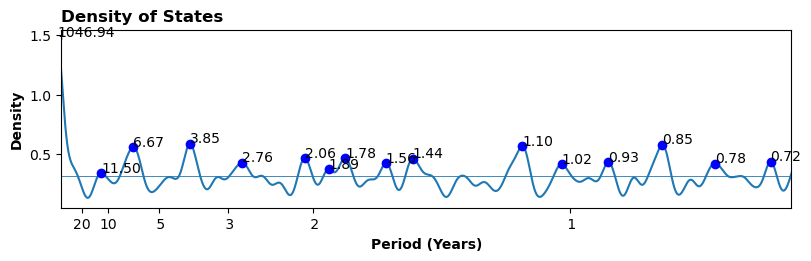

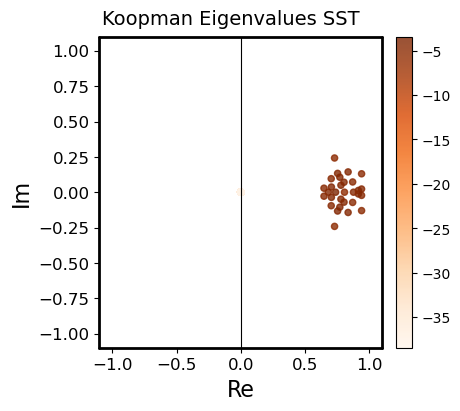

2
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.83692964681816 for a  17237.39101249653 and sigma 92.83692964681816

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



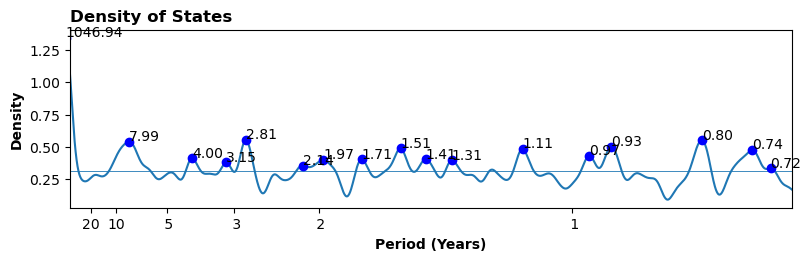

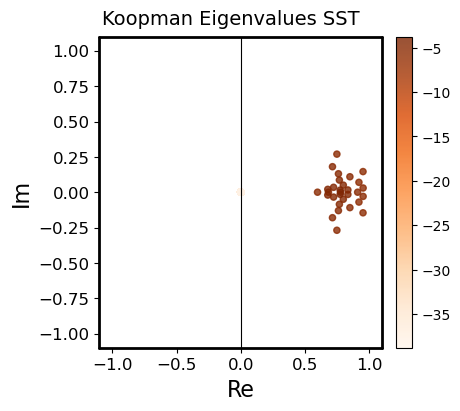

3
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 91.83892855249807 for a  16868.777595341693 and sigma 91.83892855249807

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



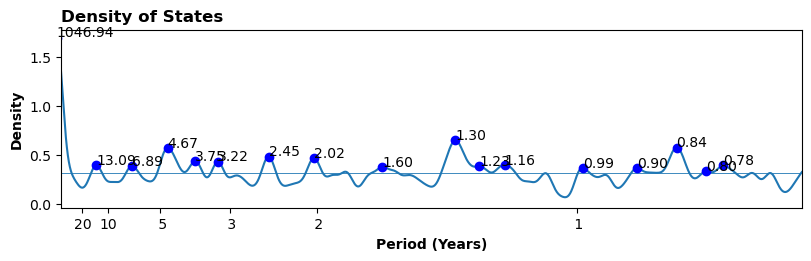

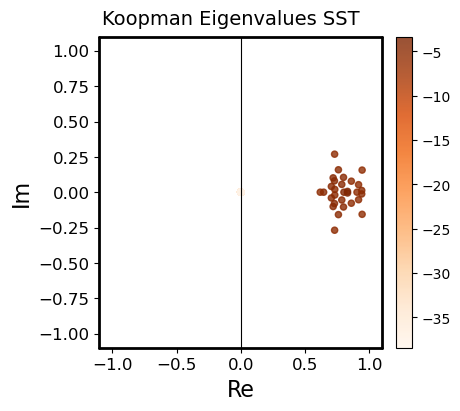

4
Created Koopman Estimator 
 for 2399 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.9526462801449 for a  17280.388900963473 and sigma 92.9526462801449

Computed Transfer Eigenvalues
Computed Kmodes (2399, 30) for (2399, 2399) normalized eigenfunctions
Computed Kmodes 2399 30 vv  2399 2399 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



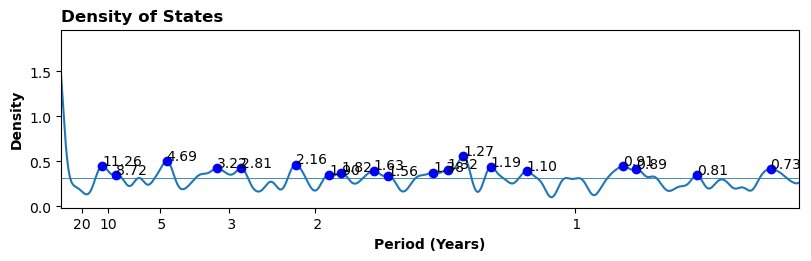

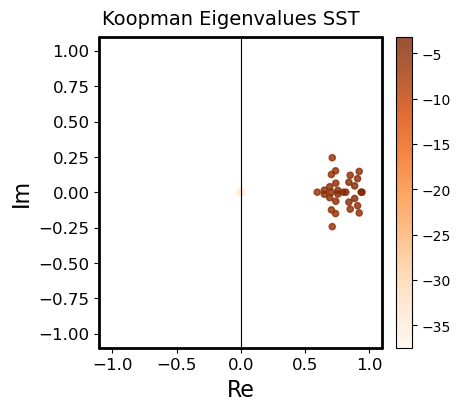

In [35]:
inverse = zkop.one_over_years
bandw =  0.006
encode_svd=True
tot_points=np.zeros((4000,5))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*2400:2400+nchunk*2400]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5,'maxeig':5000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    # ax.set_ylim(0.3,0.8)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)

    with open(f'Density_400_POLY_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)


    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   

    with open(f'Spectra_400_POLY_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    
    plt.show()


# Compute Koopman operators 1000 (2)

In [54]:
chunks=[0,1]
chunks

[0, 1]

### ALL EOFs

In [34]:
encode_svd=True

In [35]:
PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_1000_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[92.99294509, 92.87932528],
       [92.88804686, 93.53029752]])

0
Created Koopman Estimator 
 for 11999 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.88804686424542 for a  17256.37850050851 and sigma 92.88804686424542

Computed Transfer Eigenvalues
Computed Kmodes (11999, 1845) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 1845 vv  11999 11999 eigenfunctions
Rank of V matrix 11999

 `find_norm_modes` Retain only positive frequencies or zero 



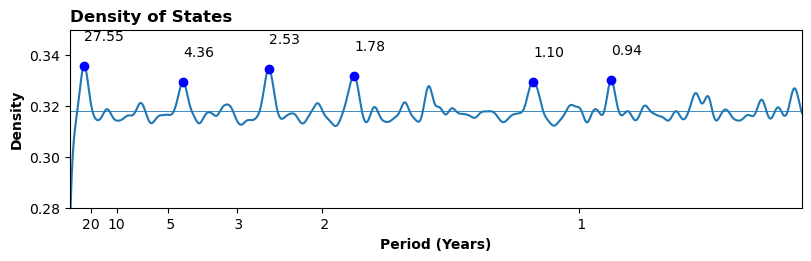

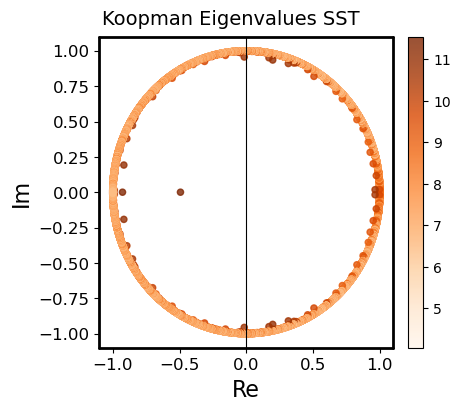

1
Created Koopman Estimator 
 for 11999 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.53029751652248 for a  17495.83310705842 and sigma 93.53029751652248

Computed Transfer Eigenvalues
Computed Kmodes (11999, 1845) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 1845 vv  11999 11999 eigenfunctions
Rank of V matrix 11999

 `find_norm_modes` Retain only positive frequencies or zero 



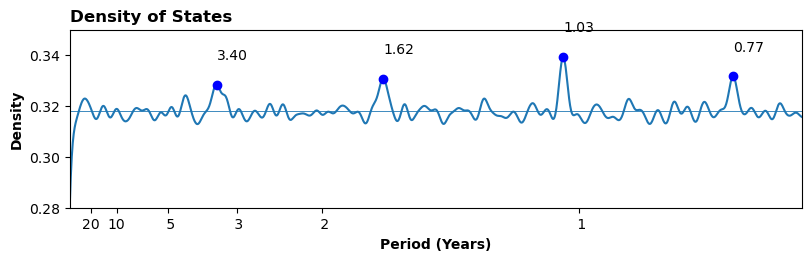

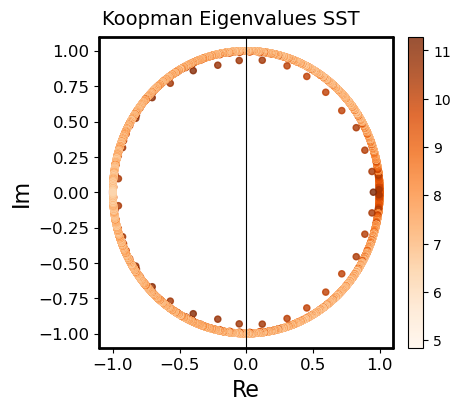

In [39]:
inverse = zkop.one_over_years
bandw =  0.0045
encode_svd=True
tot_points=np.zeros((4000,2))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*12000:12000+nchunk*12000]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5, 'maxeig':12000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw, 0.01)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    ax.set_ylim(0.28,0.35)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    with open(f'Density_1000_GALL_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)


    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')

    with open(f'Spectra_1000_GALL_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()

### 30 EOFs

In [55]:
encode_svd=True

In [56]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_1000_30EOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[91.33829881, 91.35401437],
       [78.53781194, 79.31940046]])

0
Created Koopman Estimator 
 for 11999 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 78.53781194346656 for a  12336.375809734638 and sigma 78.53781194346656

Computed Transfer Eigenvalues
Computed Kmodes (11999, 30) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 30 vv  11999 11999 eigenfunctions
Rank of V matrix 11999

 `find_norm_modes` Retain only positive frequencies or zero 



NameError: name 'data_name' is not defined

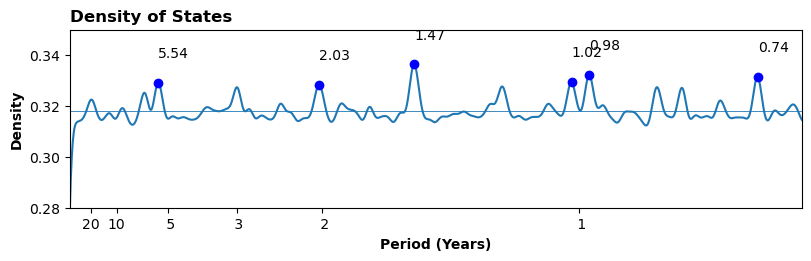

In [62]:
inverse = zkop.one_over_years
bandw =  0.0045
encode_svd=True
tot_points=np.zeros((4000,2))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*12000:12000+nchunk*12000]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5, 'maxeig':12000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw,0.01)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    ax.set_ylim(0.28,0.35)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    #labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    with open(f'Density_1000_G30_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)


    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')

    with open(f'Spectra_1000_G30_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()

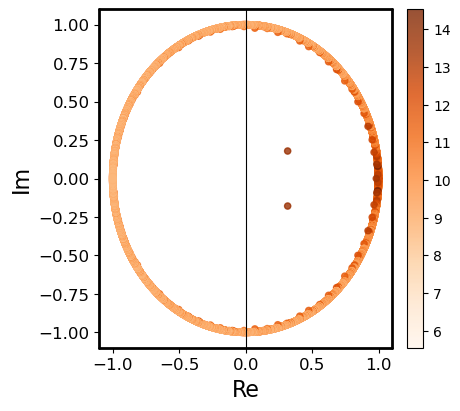

In [63]:
###########################
# PLOT EIGENVALUES
###########################
# Find quickly kmodes norms for plotting
vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
vmax = max(vvnorm)
vmin = min(vvnorm)
vscale = (vvnorm - vmin)/(vmax-vmin)


fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
plt.style.context('fivethirtyeight')

plimz=1.1
plim = 5
ar=20

ax = axu
hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
ax.axvline(0, color='black',lw=0.8)
# ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
ax.set_xlabel('Re',fontsize = 16)
ax.set_ylabel('Im',fontsize = 16)
ax.set_xlim(-plimz,plimz)
ax.set_ylim(-plimz,plimz)
plt.colorbar(hh)

zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')


### POLY EOFs

In [11]:
encode_svd=True

In [12]:
PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')
sig=np.load('Processed_data/stds_giann_1000_ALLEOFs.npy')
#EOFs=np.load('Processed_data/EOFs_CESM_20SST_10SSH.npy')
sig

array([[92.99294509, 92.87932528],
       [92.88804686, 93.53029752]])

0
Created Koopman Estimator 
 for 11999 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.88804686424542 for a  17256.37850050851 and sigma 92.88804686424542

Computed Transfer Eigenvalues
Computed Kmodes (11999, 30) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 30 vv  11999 11999 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



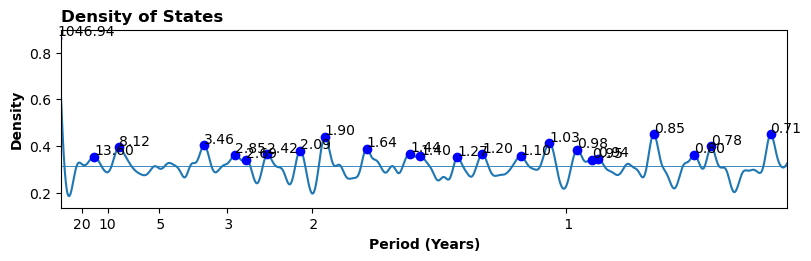

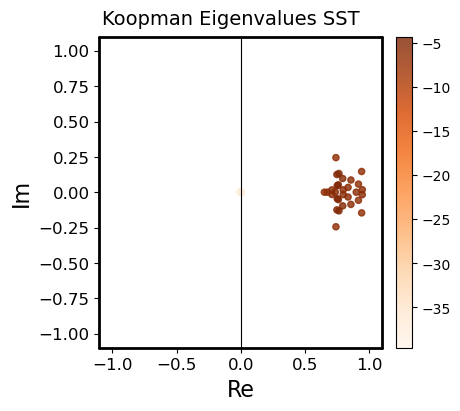

1
Created Koopman Estimator 
 for 11999 samples and 30 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.53029751652248 for a  17495.83310705842 and sigma 93.53029751652248

Computed Transfer Eigenvalues
Computed Kmodes (11999, 30) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 30 vv  11999 11999 eigenfunctions
Rank of V matrix 30

 `find_norm_modes` Retain only positive frequencies or zero 



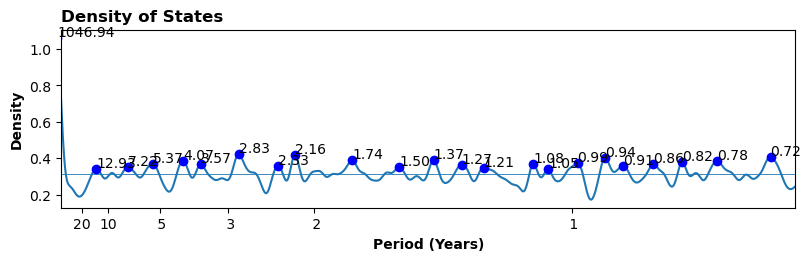

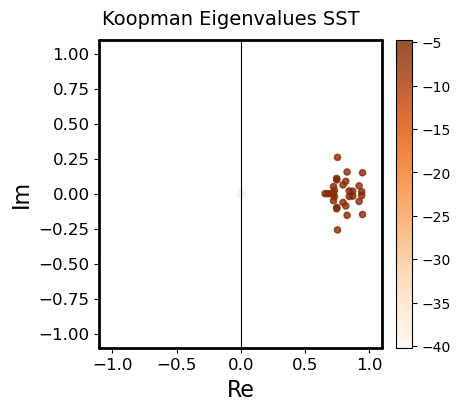

In [14]:
inverse = zkop.one_over_years
bandw =  0.0045
encode_svd=True
tot_points=np.zeros((4000,2))
import math
pi2 = 2*math.pi

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*12000:12000+nchunk*12000]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5, 'maxeig':12000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    
    fig, axu = plt.subplots(1, 1, figsize=(8,2.5),constrained_layout=True)
    ax=axu
    
    tot_points[:,nchunk] = compute_density(ax,vw_o,bandw)
    ax.set_title('Density of States',loc='left',**ftitle)
    ax.set_xlim(0.005,plim)
    #ax.set_ylim(0.25,0.35)

    labperiods = [20.,10.,5.,3.,2., 1.]
    ax.set_xticks([pi2/(12.*i) for i in labperiods ])
    ax.set_xticklabels([f'{i:2.0f}' for i in labperiods])
    ax.set_xlabel('Period (Years)',**flabel)
    ax.set_ylabel('Density',**flabel)
    #labfile =  f'{data_name}{case}_DEN_{KK.kernel_choice}{KK.bandwidth}.pdf'

    with open(f'Density_1000_POLY_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)

    plt.show()

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    
    fig,axu = plt.subplots(1, 1,figsize=(4.5,4),constrained_layout=True)
    plt.style.context('fivethirtyeight')
    
    plimz=1.1
    plim = 5
    ar=20
    
    ax = axu
    hh=ax.scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    ax.axvline(0, color='black',lw=0.8)
    # ax.set_title(f' Total, $\epsilon$={KK.epsilon}',fontsize=16,loc='left')
    ax.set_xlabel('Re',fontsize = 16)
    ax.set_ylabel('Im',fontsize = 16)
    ax.set_xlim(-plimz,plimz)
    ax.set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axu,fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axu,'all',linewidth=2,color='black',capstyle='round')

    with open(f'Spectra_1000_POLY_chunk_{m}.pickle','wb') as file:
        pickle.dump(ax, file, pickle.HIGHEST_PROTOCOL)
    
    plt.suptitle(f'Koopman Eigenvalues SST',fontsize=14)   
    plt.show()

# Fig 1

In [41]:
encode_svd=True
chunks=[0,1]

0
Created Koopman Estimator 
 for 11999 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 92.88804686424542 for a  17256.37850050851 and sigma 92.88804686424542

Computed Transfer Eigenvalues
Computed Kmodes (11999, 1845) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 1845 vv  11999 11999 eigenfunctions
Rank of V matrix 11999

 `find_norm_modes` Retain only positive frequencies or zero 

1
Created Koopman Estimator 
 for 11999 samples and 1845 features,             1 time interval
 Calculating Koopman Operator 
Using option 93.53029751652248 for a  17495.83310705842 and sigma 93.53029751652248

Computed Transfer Eigenvalues
Computed Kmodes (11999, 1845) for (11999, 11999) normalized eigenfunctions
Computed Kmodes 11999 1845 vv  11999 11999 eigenfunctions
Rank of V matrix 11999

 `find_norm_modes` Retain only positive frequencies or zero 

0
Created Koopman Estimator 
 for 11999 samples and 30 features,             1 t

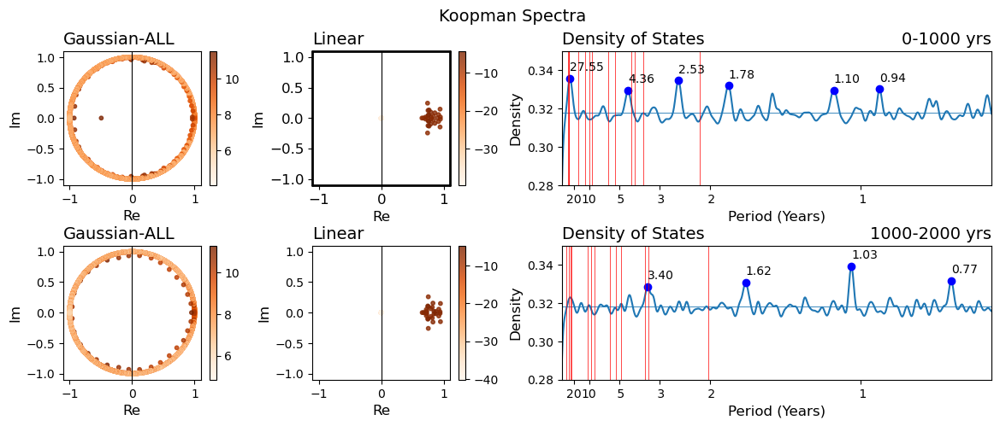

In [42]:
columns = 3
rows = 2

fig, axs = plt.subplots(rows, columns,figsize=(14,5), gridspec_kw={'width_ratios': [1,1, 2.5]})

PCs=np.load('Processed_data/PCs_CESM_845SST_1000SSH.npy')
sig=np.load('Processed_data/stds_giann_1000_ALLEOFs.npy')

inverse = zkop.one_over_years
bandw =  0.0045
encode_svd=True
tot_points=np.zeros((4000,2))
import math
pi2 = 2*math.pi


##################################################################
#############          GAUSS                ######################
##################################################################


for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*12000:12000+nchunk*12000]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'gauss',
               'bandwidth': 'std',
               'epsilon': 1e-5, 'maxeig':12000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')
    

    #ww=np.load()
    #ds = KK.compute_modes(ww,vv,modetype='',description='')
    


    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)

    plimz=1.1
    plim = 5
    ar=10
  
    hh=axs[m, 0].scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    axs[m, 0].axvline(0, color='black',lw=0.8)
    axs[m, 0].set_xlabel('Re',fontsize = 12)
    axs[m, 0].set_ylabel('Im',fontsize = 12)
    axs[m, 0].set_title('Gaussian-ALL',loc='left',**ftitle)
    #axs[m, 0].set_title(f'S {m}',loc='right',**ftitle)
    
    axs[m, 0].set_xlim(-plimz,plimz)
    axs[m, 0].set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axs[0, 1],fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axs[0, 1],'all',linewidth=2,color='black',capstyle='round')


    ###########################
    # PLOT DENSITY
    ###########################
    plim = 0.75
    name_years=['0-1000 yrs', '1000-2000 yrs']
    
    tot_points[:,nchunk] = compute_density(axs[m, 2],vw_o,bandw, 0.01)
    axs[m, 2].set_title('Density of States',loc='left',**ftitle)
    axs[m, 2].set_title(name_years[m],loc='right',**ftitle)
    axs[m, 2].set_xlim(0.005,plim)
    axs[m, 2].set_ylim(0.28,0.35)

    labperiods = [20.,10.,5.,3.,2., 1.]
    axs[m, 2].set_xticks([pi2/(12.*i) for i in labperiods ])
    axs[m, 2].set_xticklabels([f'{i:2.0f}' for i in labperiods])
    axs[m, 2].set_xlabel('Period (Years)',**flabel)
    axs[m, 2].set_ylabel('Density',**flabel)




##################################################################
#############             POLY              ######################
##################################################################



PCs=np.load('Processed_data/PCs_CESM_20SST_10SSH.npy')

for m in chunks:
    
    nchunk=chunks[m]
    print(nchunk)

    ##################################################################
    #############    FITTING KOOPMAN OPERATOR   ######################
    ##################################################################
    
    PCs_sel=PCs[:,nchunk*12000:12000+nchunk*12000]

    # Creating Koopman operator
    options = {'operator': 'Koopman', 
               'kernel_choice': 'poly',
               'bandwidth': 'std',
               'epsilon': 1e-5, 'maxeig':12000}    #, 'time_data': X_tos_sel.time.data[:-1]
    
    if encode_svd:
        KK=zkop.Koop(PCs_sel,**options)    #720 instead of 360
    else:
        KK=zkop.Koop(xdat,**options)

    KK.fit(bandwidth=sig[1,m])

    #wf,wfg,vvf = KK.order(cut_period=0)
    #wo,vvo,indone = KK.eigone(wf,vvf,tolone)

    ds = KK.compute_modes(KK.ww,KK.vv,modetype='',description='')

    if encode_svd:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',simplify_conjugates=True)
    else:
        (v_o,KM_o,VM_o, vw_o),(indnorm, v_s,KM_s,VM_s,vw_s) = \
           KK.find_norm_modes(ds.kmodes, ds.eigfun, ds.eigval, sort='sort',decode=None)

    
    ###########################
    # PLOT EIGENVALUES
    ###########################
    # Find quickly kmodes norms for plotting
    vvnorm = np.log(sc.norm(ds.kmodes,axis=0))
    vmax = max(vvnorm)
    vmin = min(vvnorm)
    vscale = (vvnorm - vmin)/(vmax-vmin)
      
    hh=axs[m, 1].scatter(ds.eigval.real, ds.eigval.imag, s=ar,c=vvnorm,cmap='Oranges',alpha=0.8)
    axs[m, 1].axvline(0, color='black',lw=0.8)
    axs[m, 1].set_xlabel('Re',fontsize = 12)
    axs[m, 1].set_ylabel('Im',fontsize = 12)
    axs[m, 1].set_title('Linear',loc='left',**ftitle)
    #axs[m, 1].set_title(f'S {m}',loc='right',**ftitle)
    axs[m, 1].set_xlim(-plimz,plimz)
    axs[m, 1].set_ylim(-plimz,plimz)
    plt.colorbar(hh)
    
    zmap.changelabel(axs[0, 1],fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axs[0, 1],'all',linewidth=2,color='black',capstyle='round')


    ###########################
    # PLOT STATE POINTS
    ###########################

    #axs[m, 2].scatter(ds.eigval.imag, np.zeros(len(ds.eigval.imag)),c='red',alpha=1)
    #zkop.one_over_years(ds.eigval.imag)[(abs(zkop.one_over_years(ds.eigval.imag)) < 10000000) & (zkop.one_over_years(ds.eigval.imag)>0)]
    for i in range(len(ds.eigval.imag)):
        axs[m, 2].axvline(ds.eigval.imag[i], color='red',lw=0.5)

     
plt.suptitle(f'Koopman Spectra',fontsize=14)
plt.subplots_adjust(wspace=0.3, hspace=0.45)

plt.savefig('Fig 1.pdf', orientation='landscape',  format='pdf')
plt.savefig('Fig 1.jpg', orientation='landscape',  format='jpg')

plt.show()




# Fig 2

In [25]:
from pylab import *

flabel = {'fontsize':12,'fontweight':'normal'}   #,'fontfamily':'Futura'
ftitle = {'fontsize':14,'fontweight':'normal'}   #,'fontfamily':'Futura',

plimz=1.1
plim = 5
ar=12

In [26]:
def plot_spectrum(eigenvalues, cmap, col, row, title, title1, labelx, labely): 
    hh=axs[row, col].scatter(eigenvalues.real, eigenvalues.imag, s=ar,alpha=0.3,c=color_list[m])
    axs[row, col].axvline(0, color='black',lw=0.8)
    if labelx==True:
        axs[row, col].set_xlabel('Re',fontsize = 12)
    if labely==True:
        axs[row, col].set_ylabel('Im',fontsize = 12)
    axs[row, col].set_title(title,loc='left',**{'fontsize':14,'fontweight':'bold'})
    axs[row, col].set_title(title1,loc='right',**ftitle)
    axs[row, col].set_xlim(-plimz,plimz)
    axs[row, col].set_ylim(-plimz,plimz)
    zmap.changelabel(axs[row, col],fontsize=12,fontfamily='DejaVu Sans',fontweight='normal')
    zmap.changebox(axs[row, col],'all',linewidth=2,color='black',capstyle='round')

    return 

0
1
0
2
4
6
8
0
2
4
6
8
10
12
14
16
18
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39


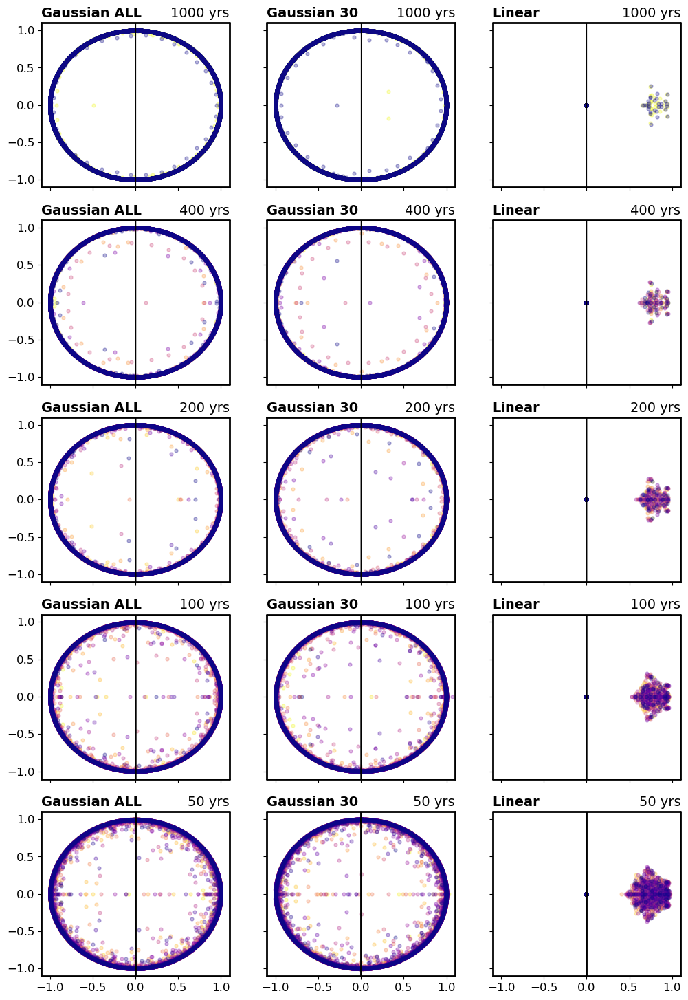

In [27]:
# TOTALE

columns = 3
rows = 5

fig, axs = plt.subplots(rows, columns,figsize=(12,18),sharey=True,sharex=True)


##################################################################
#############            1000               ######################
##################################################################

chunks=[0,1]
for m in chunks:

    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    
    nchunk=chunks[m]
    print(nchunk)
    eig_GALL=np.load(f'Processed_data/1000 yrs Koopman Operators/GALL_eigvals_{m}.npy')
    eig_G30=np.load(f'Processed_data/1000 yrs Koopman Operators/noreg_G30_eigvals_{m}.npy')
    eig_Poly=np.load(f'Processed_data/1000 yrs Koopman Operators/POLY_eigvals_{m}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=0, title='Gaussian ALL', title1='1000 yrs',labelx=False, labely=False)
    plot_spectrum(eig_G30,color_list, col=1, row=0, title='Gaussian 30', title1='1000 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=0, title='Linear', title1='1000 yrs',labelx=False, labely=False)

##################################################################
#############            400               ######################
##################################################################

chunks=[0,2,4,6,8]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    
    print(op)
    eig_GALL=np.load(f'Processed_data/400 yrs Koopman Operators/GALL_eigvals_{op}.npy')
    eig_G30=np.load(f'Processed_data/400 yrs Koopman Operators/noreg_G30_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/400 yrs Koopman Operators/POLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=1, title='Gaussian ALL', title1='400 yrs',labelx=False, labely=False)
    plot_spectrum(eig_G30,color_list, col=1, row=1, title='Gaussian 30', title1='400 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=1, title='Linear', title1='400 yrs',labelx=False, labely=False)

##################################################################
#############            200               ######################
##################################################################

chunks=[0,2,4,6,8,10,12,14,16,18]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
  
    print(op)
    eig_GALL=np.load(f'Processed_data/200 yrs Koopman Operators/GALL_eigvals_{op}.npy')
    eig_G30=np.load(f'Processed_data/200 yrs Koopman Operators/noreg_G30_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/200 yrs Koopman Operators/GOLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=2, title='Gaussian ALL', title1='200 yrs',labelx=False, labely=False)
    plot_spectrum(eig_G30,color_list, col=1, row=2, title='Gaussian 30', title1='200 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=2, title='Linear', title1='200 yrs',labelx=False, labely=False)


##################################################################
#############            100               ######################
##################################################################

chunks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
  
    print(op)
    eig_GALL=np.load(f'Processed_data/100 yrs Koopman Operators/noreg_GALL_eigvals_{op}.npy')
    eig_G30=np.load(f'Processed_data/100 yrs Koopman Operators/noreg_G30_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/100 yrs Koopman Operators/noreg_POLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=3, title='Gaussian ALL', title1='100 yrs',labelx=False, labely=False)
    plot_spectrum(eig_G30,color_list, col=1, row=3, title='Gaussian 30', title1='100 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=3, title='Linear', title1='100 yrs',labelx=False, labely=False)

##################################################################
#############            50               ######################
##################################################################

chunks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
  
  
    print(op)
    eig_GALL=np.load(f'Processed_data/50 yrs Koopman Operators/noreg_GALL_eigvals_{op}.npy')
    eig_G30=np.load(f'Processed_data/50 yrs Koopman Operators/noreg_G30_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/50 yrs Koopman Operators/noreg_POLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=4, title='Gaussian ALL', title1='50 yrs',labelx=False, labely=False)
    plot_spectrum(eig_G30,color_list, col=1, row=4, title='Gaussian 30', title1='50 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=4, title='Linear', title1='50 yrs',labelx=False, labely=False)

plt.savefig('Fig 2_Extended.pdf', orientation='landscape',  format='pdf')
plt.savefig('Fig 2_Extended.jpg', orientation='landscape',  format='jpg')     


plt.show()

In [8]:
from pylab import *

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39


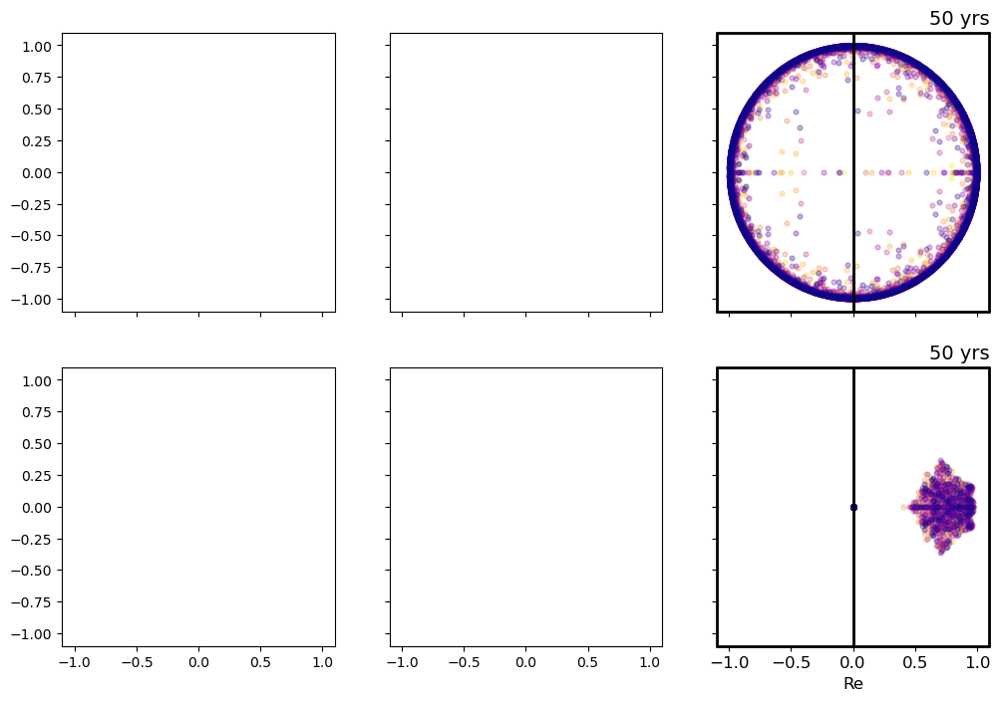

In [36]:
# PARZIALE

columns = 3
rows = 2

fig, axs = plt.subplots(rows, columns,figsize=(12,8),sharey=True,sharex=True)


'''##################################################################
#############            1000               ######################
##################################################################

chunks=[0,1]
for m in chunks:

    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    
    nchunk=chunks[m]
    print(nchunk)
    eig_GALL=np.load(f'Processed_data/1000 yrs Koopman Operators/GALL_eigvals_{m}.npy')
    eig_Poly=np.load(f'Processed_data/1000 yrs Koopman Operators/POLY_eigvals_{m}.npy')

    plot_spectrum(eig_GALL,color_list, col=0, row=0, title='Gaussian-ALL', title1='1000 yrs', labelx=False, labely=True)
    plot_spectrum(eig_Poly,color_list, col=0, row=1, title='Linear', title1='1000 yrs',labelx=True, labely=True)

#############################################################
#############            200               ######################
##################################################################

chunks=[0,2,4,6,8,10,12,14,16,18]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
  
    print(op)
    eig_GALL=np.load(f'Processed_data/200 yrs Koopman Operators/GALL_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/200 yrs Koopman Operators/GOLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=1, row=0, title='', title1='200 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=1, row=1, title='', title1='200 yrs',labelx=True, labely=False)'''



##################################################################
#############            50               ######################
##################################################################

chunks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39]
for m in range(len(chunks)):

    op=chunks[m]
    cmap = cm.get_cmap('plasma_r', len(chunks))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
  
    print(op)
    eig_GALL=np.load(f'Processed_data/50 yrs Koopman Operators/noreg_GALL_eigvals_{op}.npy')
    eig_Poly=np.load(f'Processed_data/50 yrs Koopman Operators/noreg_POLY_eigvals_{op}.npy')

    plot_spectrum(eig_GALL,color_list, col=2, row=0, title='', title1='50 yrs',labelx=False, labely=False)
    plot_spectrum(eig_Poly,color_list, col=2, row=1, title='', title1='50 yrs',labelx=True, labely=False)

plt.savefig('Fig 2.pdf', orientation='landscape',  format='pdf')
plt.savefig('Fig 2.jpg', orientation='landscape',  format='jpg')     

plt.show()